<div class="alert alert-block alert-info">
<h1> Analyse synthetic peak table</h1>
</div>

---
# Table of contents
- [0 - Import modules](#0---Import-modules)
- [0 - Import data](#0---Import-data)
- [1 - Preprocess data](#1---Preprocess-data)
  - [a - Transform data to adapt with input requirements](#a---Transform-data-to-adapt-with-input-requirements)
- [2 - Explore data](#2---Explore-data)
  - [a - Feature types](#a---Feature-types)
  - [b - Missing values exploration](#b---Missing-values-exploration)
  - [c - Correlation between features](#c---Correlation-between-features)
  - [d - Remove strongly correlated features (to potentially avoid issues during further analysis)](#d---Remove-strongly-correlated-features-(to-potentially-avoid-issues-during-further-analysis))
  - [e - PCA](#e---PCA)
  - [f - Target visualisation](#f---Target-visualisation)
  - [g - Feature visualisation](#g---Feature-visualisation)
- [3 - Impute missing values](#3---Impute-missing-values)
  - [a - Impute intensities with 1's](#a---Impute-intensities-with-1's)
  - [b - Impute intensities with half minimum value in features](#b---Impute-intensities-with-half-minimum-value-in-features)
- [4 - Transformations](#4---Transformations)
  - [a - log transformation](#a---log-transformation)
  - [b - Standard scale intensities](#b---Standard-scale-intensities)
- [5 - Dimensionality reduction](#5---Dimensionality-reduction)
  - [a - PCA then t-SNE](#a---PCA-then-t-SNE)
  - [b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$](#b---Feature-selection-keeping-all-features-with-ANOVA-pvalue-$\lt-\alpha-\hspace{0.39cm}$)
  - [c - Feature selection keeping a specific number of features](#c---Feature-selection-keeping-a-specific-number-of-features)
- [6 - Classification](#6---Classification)
  - [a - Launch pipeline with differently preprocessed dataframes](#a---Launch-pipeline-with-differently-preprocessed-dataframes)
- [7 - Clustering](#7---Clustering)
  - [a - Kmeans](#a---Kmeans)
  - [b - Affinity propagation](#b---Affinity-propagation)
  - [c - Hierarchical clustering](#c---Hierarchical-clustering)
---

# 0 - Import modules

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import cimcb_lite as cb

In [2]:
import re
pwd = ! pwd
pwd = re.sub('notebooks/', '', pwd[0])
pwd = '/'.join(pwd.split('/')[:-1]) + '/'
print(f'Working directory : {pwd}')

python_version = ! python --version
print(f'Python version : {python_version[0]}')

Working directory : /home/jovyan/work/
Python version : Python 3.10.4


In [3]:
# Tune the visual settings for figures in seaborn
sns.set_context(
    "notebook", font_scale=1.2, rc={"figure.figsize": (15,8), "axes.titlesize": 15}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 15, 8

sns.set_theme(style="darkgrid")

In [4]:
import sys
sys.path.append(pwd + 'bin/')

# 0 - Import data

In [5]:
#peakTable_init = pd.read_csv(pwd + 'data/synthetic_dataset/synthetic_dataset.csv')
peakTable_init = pd.read_csv(pwd + 'data/synthetic_dataset/synthetic_dataset.csv')
peakTable_init

,SampleID,Disease,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_7,variable_8,...,variable_1577,variable_1578,variable_1579,variable_1580,variable_1581,variable_1582,variable_1583,variable_1584,variable_1585,variable_1586
0,CRR_001,CRR,338.456110,178.997547,1364.243610,178.566806,1260.377806,44.344496,55.796025,2751.042698,...,161.620293,154.641680,122.966131,200.181130,108.874302,39.070556,31.559976,9.890546,3.383657,91.426041
1,CRR_002,CRR,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.651690
2,CRR_003,CRR,366.706487,259.462600,802.787197,120.202964,788.551524,9.570326,261.181502,1921.042077,...,1357.140051,1190.683407,829.900226,65.412171,45.214879,90.370919,103.487015,59.137657,34.081487,98.715702
3,CRR_004,CRR,630.968755,247.373452,644.469610,126.616534,691.180244,16.854885,104.088563,1806.360838,...,808.883248,704.194508,467.830721,218.903055,188.936331,416.487538,399.617280,260.490720,91.779628,84.990165
4,CRR_005,CRR,316.203152,165.324430,858.162423,63.108923,972.719569,18.614440,114.789512,2906.624798,...,1106.339706,985.445203,606.873358,52.306891,35.526111,78.036385,118.761528,59.275319,15.577894,133.434192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,HCC_296,HCC,643.700607,81.726317,44.298642,116.982461,119.174566,72.642404,121.975205,94.489327,...,49.091504,53.297007,41.558690,401.009245,152.326900,386.074936,381.232144,222.658487,87.510142,30.000411
596,HCC_297,HCC,138.210427,50.414871,90.982461,35.704599,175.506588,2.650791,43.151415,320.329420,...,100.420199,168.944895,89.002824,143.163696,62.475109,419.294886,101.123175,232.384665,36.662697,50.824708
597,HCC_298,HCC,580.244633,349.744638,104.137371,254.813580,158.453363,179.001723,338.943420,399.591114,...,67.269016,78.898968,51.698185,593.243068,268.741349,994.989449,1024.469181,594.484297,293.836934,64.710812
598,HCC_299,HCC,582.544934,257.779379,92.690730,199.052746,115.963688,138.686838,259.289094,289.935184,...,58.150120,76.681469,32.480158,348.691701,270.821618,843.855874,889.085754,532.545891,253.921888,44.034351


In [6]:
peakTable = peakTable_init.copy()

# 1 - Preprocess data

In [7]:
from explore_data_functions import *

### Separate intensities (in dataframe <code>X</code>) and metadata (in dataframe <code>metadata</code>)

In [8]:
#metadata = peakTable[['SampleID', 'CaseCtrl']]
metadata = peakTable[['SampleID', 'Disease']]
metadata

,SampleID,Disease
0,CRR_001,CRR
1,CRR_002,CRR
2,CRR_003,CRR
3,CRR_004,CRR
4,CRR_005,CRR
...,...,...
595,HCC_296,HCC
596,HCC_297,HCC
597,HCC_298,HCC
598,HCC_299,HCC


In [9]:
target = metadata['Disease']

In [10]:
X = peakTable.drop(metadata.columns, axis=1)
X

,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_7,variable_8,variable_9,variable_10,...,variable_1577,variable_1578,variable_1579,variable_1580,variable_1581,variable_1582,variable_1583,variable_1584,variable_1585,variable_1586
0,338.456110,178.997547,1364.243610,178.566806,1260.377806,44.344496,55.796025,2751.042698,161.102598,2547.881096,...,161.620293,154.641680,122.966131,200.181130,108.874302,39.070556,31.559976,9.890546,3.383657,91.426041
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,73.665886,1551.050083,92.467096,1443.736018,...,50.584648,52.091682,27.073475,404.589261,223.520876,442.007981,402.357357,281.384643,128.797298,47.651690
2,366.706487,259.462600,802.787197,120.202964,788.551524,9.570326,261.181502,1921.042077,553.027989,1797.210358,...,1357.140051,1190.683407,829.900226,65.412171,45.214879,90.370919,103.487015,59.137657,34.081487,98.715702
3,630.968755,247.373452,644.469610,126.616534,691.180244,16.854885,104.088563,1806.360838,428.524942,1689.620044,...,808.883248,704.194508,467.830721,218.903055,188.936331,416.487538,399.617280,260.490720,91.779628,84.990165
4,316.203152,165.324430,858.162423,63.108923,972.719569,18.614440,114.789512,2906.624798,651.571161,607.654172,...,1106.339706,985.445203,606.873358,52.306891,35.526111,78.036385,118.761528,59.275319,15.577894,133.434192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,643.700607,81.726317,44.298642,116.982461,119.174566,72.642404,121.975205,94.489327,3.171222,262.666861,...,49.091504,53.297007,41.558690,401.009245,152.326900,386.074936,381.232144,222.658487,87.510142,30.000411
596,138.210427,50.414871,90.982461,35.704599,175.506588,2.650791,43.151415,320.329420,83.308540,88.486708,...,100.420199,168.944895,89.002824,143.163696,62.475109,419.294886,101.123175,232.384665,36.662697,50.824708
597,580.244633,349.744638,104.137371,254.813580,158.453363,179.001723,338.943420,399.591114,23.876031,475.352721,...,67.269016,78.898968,51.698185,593.243068,268.741349,994.989449,1024.469181,594.484297,293.836934,64.710812
598,582.544934,257.779379,92.690730,199.052746,115.963688,138.686838,259.289094,289.935184,21.925505,359.996650,...,58.150120,76.681469,32.480158,348.691701,270.821618,843.855874,889.085754,532.545891,253.921888,44.034351


# 2 - Explore data

## a - Feature types

######################################################################################################################################################
Data types : 
float64    1586
object        2
dtype: int64



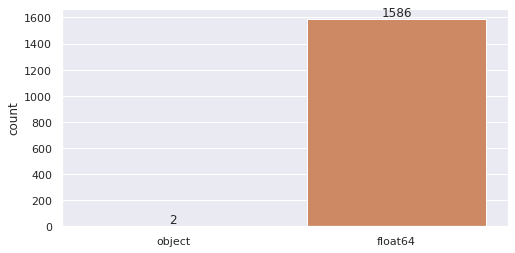

######################################################################################################################################################


In [11]:
plot_feature_types(peakTable)

## b - Missing values exploration

In [12]:
plot_infos_missing_values(X)

######################################################################################################################################################
Considering None as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 3486
- Percent of missing values : 0.37%



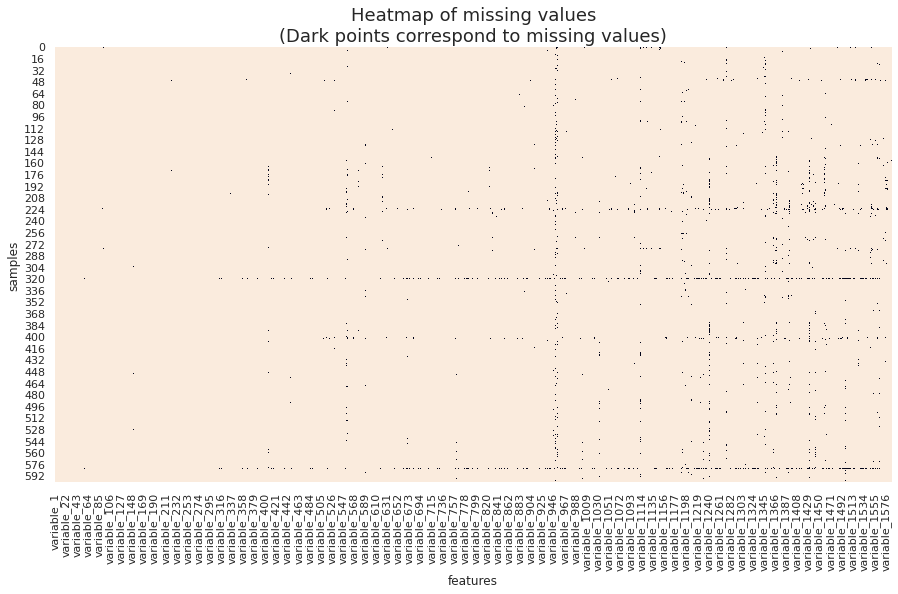

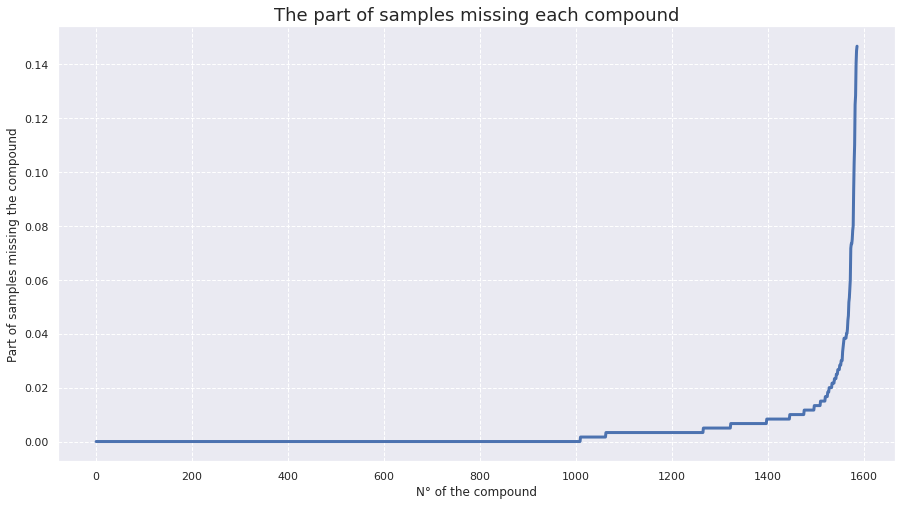



######################################################################################################################################################


In [13]:
plot_infos_missing_values(X, na_values=0)

## c - Correlation between features

######################################################################################################################################################


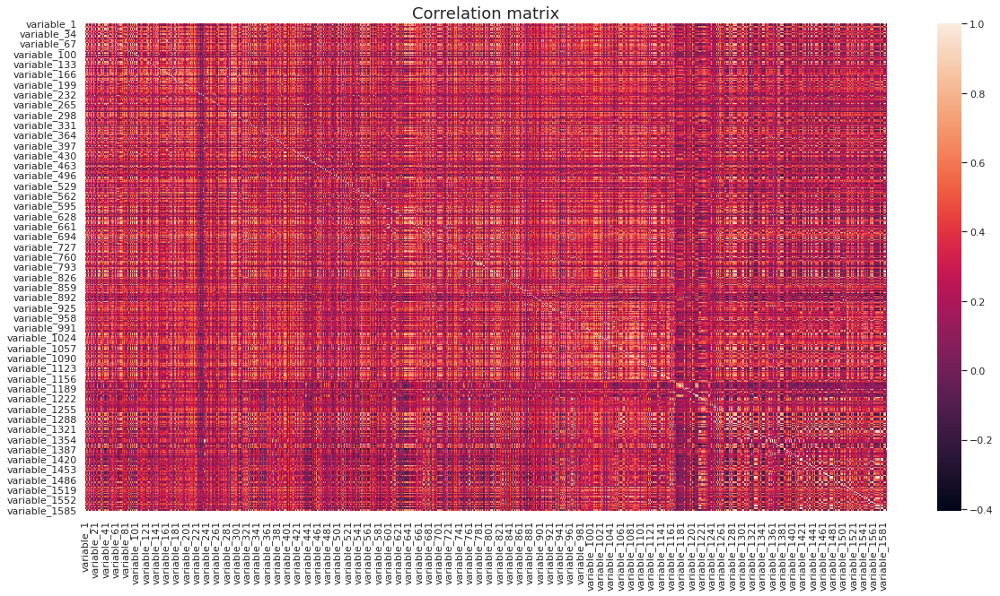

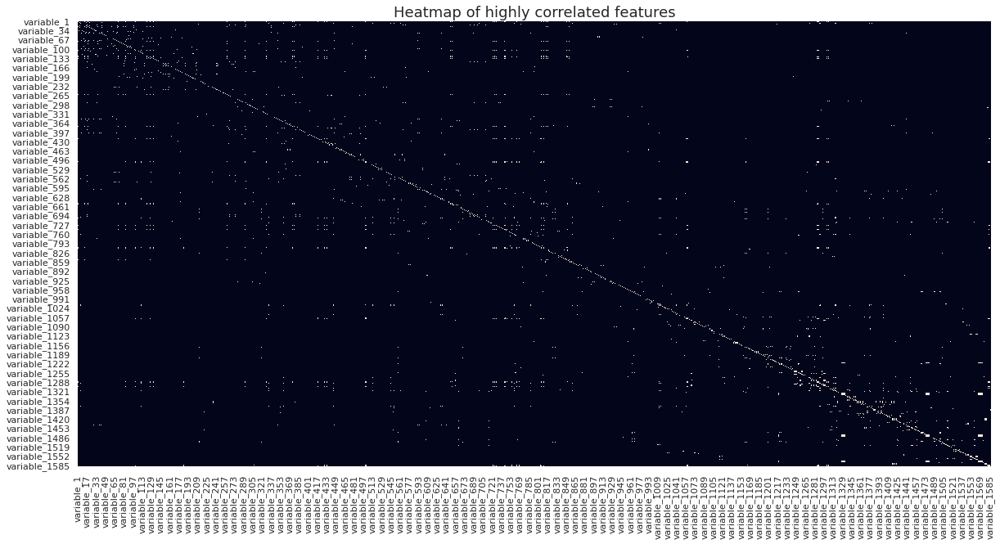



###################################################################################################################################################### 



In [14]:
plot_correlation_matrix(X, threshold=0.9)

## d - Remove strongly correlated features (to potentially avoid issues during further analysis)

In [15]:
X_remove_corr = remove_correlated_features(X, threshold=0.8)
X_remove_corr

Initial shape : (600, 1586)
Final shape : (600, 293)

Time to compute : 00h00m03s

 ######################################################################################################################################################






,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_9,variable_10,variable_12,variable_16,...,variable_1323,variable_1352,variable_1363,variable_1383,variable_1415,variable_1462,variable_1524,variable_1528,variable_1533,variable_1540
0,338.456110,178.997547,1364.243610,178.566806,1260.377806,44.344496,161.102598,2547.881096,11588.670641,642.895680,...,2342.225352,93.637941,135.740580,144.399247,70.939871,34.230355,9.317409,330.902976,110.060420,12.914492
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,92.467096,1443.736018,7506.235783,378.804289,...,1051.366461,50.440223,265.663987,73.039082,55.239880,15.842787,112.927400,180.437923,53.271213,118.352041
2,366.706487,259.462600,802.787197,120.202964,788.551524,9.570326,553.027989,1797.210358,9122.852120,313.832971,...,1645.522055,37.363932,6231.880196,163.883190,889.788269,1538.069893,441.556077,359.139706,336.165316,433.291420
3,630.968755,247.373452,644.469610,126.616534,691.180244,16.854885,428.524942,1689.620044,8651.959451,181.063777,...,1243.435039,7.057389,1586.247463,123.219385,469.967924,1062.700095,111.584693,371.615699,223.423291,206.703846
4,316.203152,165.324430,858.162423,63.108923,972.719569,18.614440,651.571161,607.654172,10585.652292,238.982625,...,1557.929503,14.252545,1806.693220,265.664951,645.723732,2185.034822,269.070700,1033.820892,389.472377,692.609969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,643.700607,81.726317,44.298642,116.982461,119.174566,72.642404,3.171222,262.666861,2035.671947,15.886810,...,76.182141,12.108396,310.592271,23.653173,90.760722,0.231091,115.487994,87.505753,13.689649,122.634629
596,138.210427,50.414871,90.982461,35.704599,175.506588,2.650791,83.308540,88.486708,1005.482356,12.539922,...,71.017145,17.150164,145.198646,149.334740,87.697206,448.532945,53.358525,75.747775,40.250550,57.360363
597,580.244633,349.744638,104.137371,254.813580,158.453363,179.001723,23.876031,475.352721,1780.862860,52.026375,...,504.195020,36.241334,2938.202038,80.287923,54.003996,2.524895,129.468179,210.178214,26.026989,274.814748
598,582.544934,257.779379,92.690730,199.052746,115.963688,138.686838,21.925505,359.996650,1109.528784,43.556516,...,304.821008,19.922244,2118.235056,55.036961,62.245614,2.471958,105.561574,166.763694,9.861801,224.970772


In [16]:
peakTable_remove_corr = pd.concat([metadata, X_remove_corr], axis=1)
peakTable_remove_corr

,SampleID,Disease,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_9,variable_10,...,variable_1323,variable_1352,variable_1363,variable_1383,variable_1415,variable_1462,variable_1524,variable_1528,variable_1533,variable_1540
0,CRR_001,CRR,338.456110,178.997547,1364.243610,178.566806,1260.377806,44.344496,161.102598,2547.881096,...,2342.225352,93.637941,135.740580,144.399247,70.939871,34.230355,9.317409,330.902976,110.060420,12.914492
1,CRR_002,CRR,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,92.467096,1443.736018,...,1051.366461,50.440223,265.663987,73.039082,55.239880,15.842787,112.927400,180.437923,53.271213,118.352041
2,CRR_003,CRR,366.706487,259.462600,802.787197,120.202964,788.551524,9.570326,553.027989,1797.210358,...,1645.522055,37.363932,6231.880196,163.883190,889.788269,1538.069893,441.556077,359.139706,336.165316,433.291420
3,CRR_004,CRR,630.968755,247.373452,644.469610,126.616534,691.180244,16.854885,428.524942,1689.620044,...,1243.435039,7.057389,1586.247463,123.219385,469.967924,1062.700095,111.584693,371.615699,223.423291,206.703846
4,CRR_005,CRR,316.203152,165.324430,858.162423,63.108923,972.719569,18.614440,651.571161,607.654172,...,1557.929503,14.252545,1806.693220,265.664951,645.723732,2185.034822,269.070700,1033.820892,389.472377,692.609969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,HCC_296,HCC,643.700607,81.726317,44.298642,116.982461,119.174566,72.642404,3.171222,262.666861,...,76.182141,12.108396,310.592271,23.653173,90.760722,0.231091,115.487994,87.505753,13.689649,122.634629
596,HCC_297,HCC,138.210427,50.414871,90.982461,35.704599,175.506588,2.650791,83.308540,88.486708,...,71.017145,17.150164,145.198646,149.334740,87.697206,448.532945,53.358525,75.747775,40.250550,57.360363
597,HCC_298,HCC,580.244633,349.744638,104.137371,254.813580,158.453363,179.001723,23.876031,475.352721,...,504.195020,36.241334,2938.202038,80.287923,54.003996,2.524895,129.468179,210.178214,26.026989,274.814748
598,HCC_299,HCC,582.544934,257.779379,92.690730,199.052746,115.963688,138.686838,21.925505,359.996650,...,304.821008,19.922244,2118.235056,55.036961,62.245614,2.471958,105.561574,166.763694,9.861801,224.970772


## e - PCA

In [17]:
if plot_infos_missing_values(X_remove_corr, na_values=0, plot=False) == 0:
    cb.plot.pca(X_remove_corr, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

NaNs in peak table, please impute before using PCA


In [18]:
if plot_infos_missing_values(X_remove_corr, na_values=0, plot=False) == 0:
    PCA_3D(X_remove_corr, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

NaNs in peak table, please impute before using PCA


### Here missing values are 0's, not NaNs so we could have plot PCA but we will still impute missing values before plotting

## f - Target visualisation

In [19]:
# target = 

######################################################################################################################################################
Target values : 
CRR    300
HCC    300
Name: Disease, dtype: int64



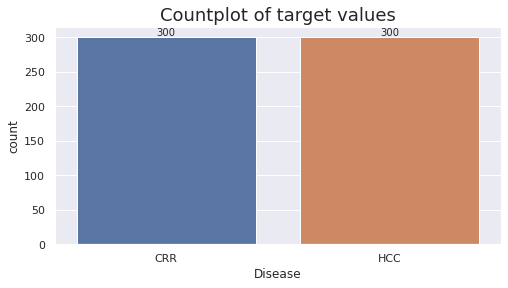

###################################################################################################################################################### 



In [20]:
plot_target(target)

## g - Feature visualisation

The following visualisations show the distributions of the chosen features of the peak table.

### We can set the number of features with <code>nb_features</code> parameter, which will plot the first N features of the peak table.

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

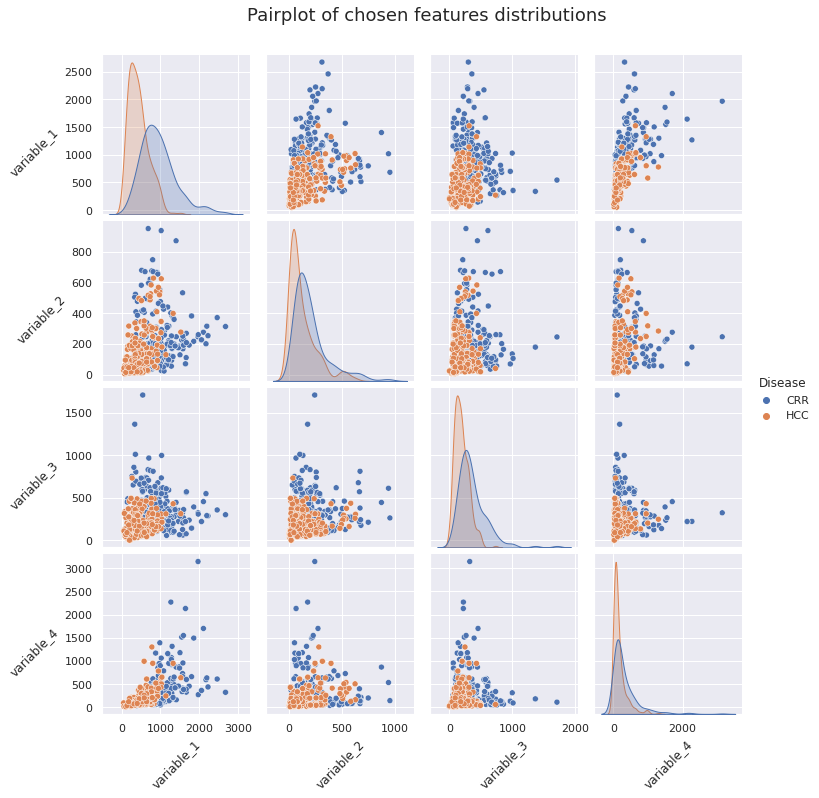

###################################################################################################################################################### 



In [21]:
plot_pairplot_distributions(X_remove_corr, target, nb_features=4)

### We can also set the list of features we want to plot with <code>list_features</code> parameter.

In [22]:
n_features = 3

list_features = random.sample(X_remove_corr.columns.tolist(), n_features)
list_features

['variable_51', 'variable_76', 'variable_175']

######################################################################################################################################################



<Figure size 720x720 with 0 Axes>

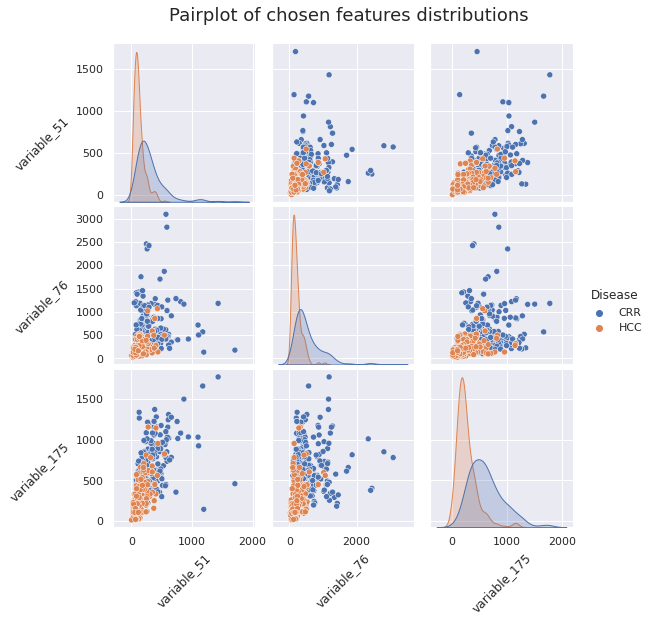

###################################################################################################################################################### 



In [23]:
plot_pairplot_distributions(X_remove_corr, target, list_features=list_features)

### Here we can observe histogram and boxplot for each chosen feature

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


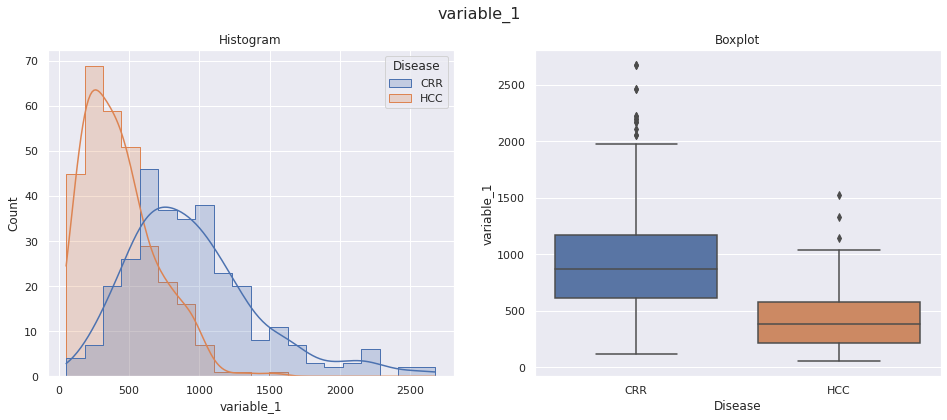

------------------------------------------------------------------------------------------------------------------------


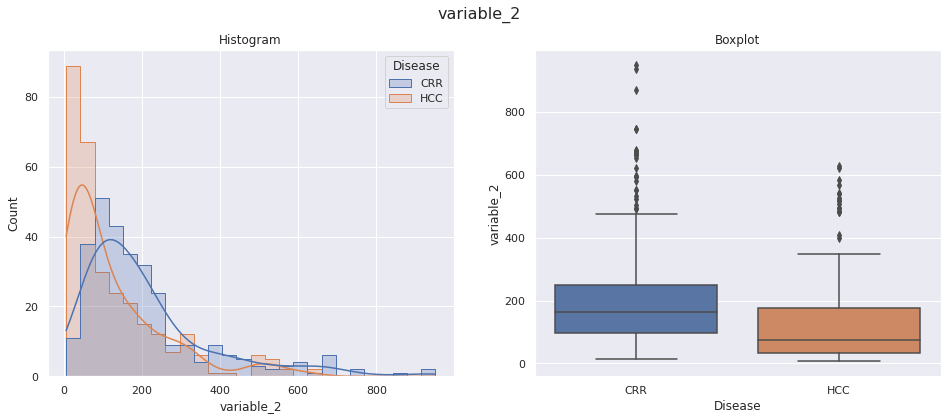

------------------------------------------------------------------------------------------------------------------------


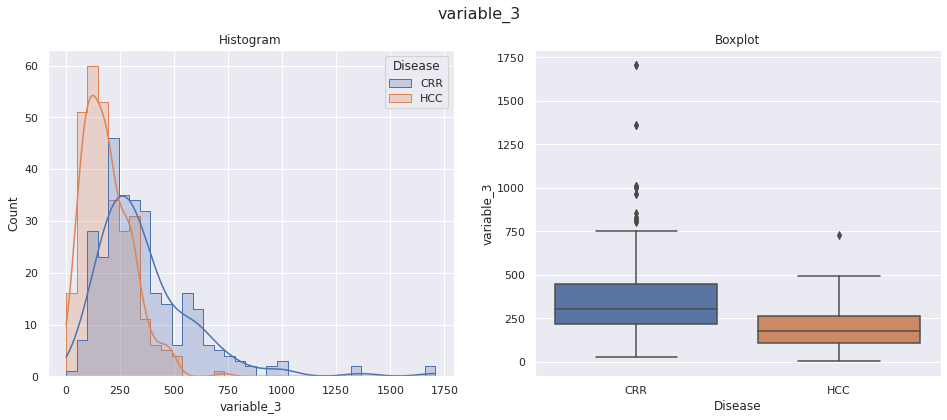

------------------------------------------------------------------------------------------------------------------------


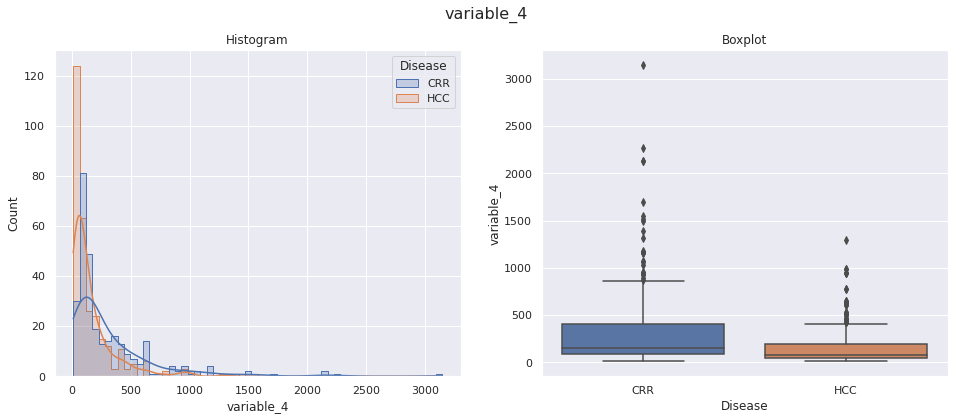

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [24]:
plot_hist_boxplot_distributions(X_remove_corr, target, nb_features=4)

######################################################################################################################################################

------------------------------------------------------------------------------------------------------------------------


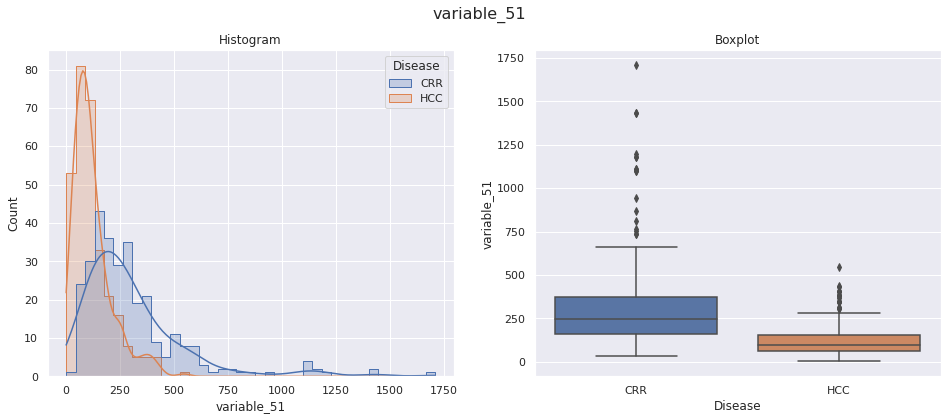

------------------------------------------------------------------------------------------------------------------------


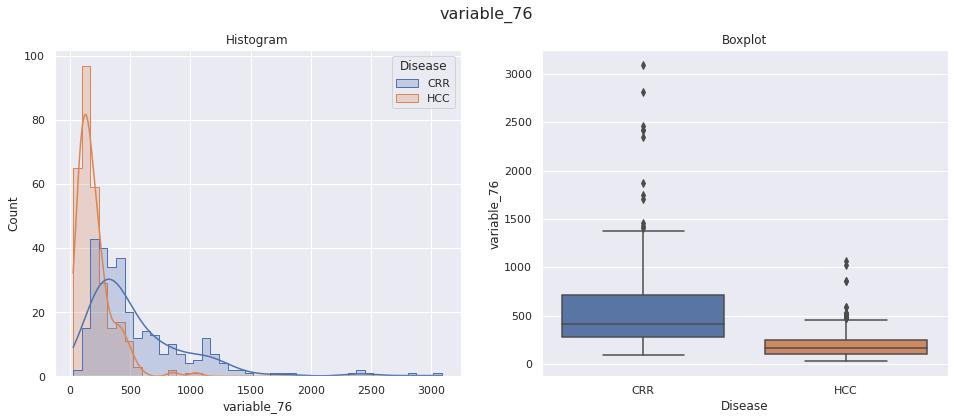

------------------------------------------------------------------------------------------------------------------------


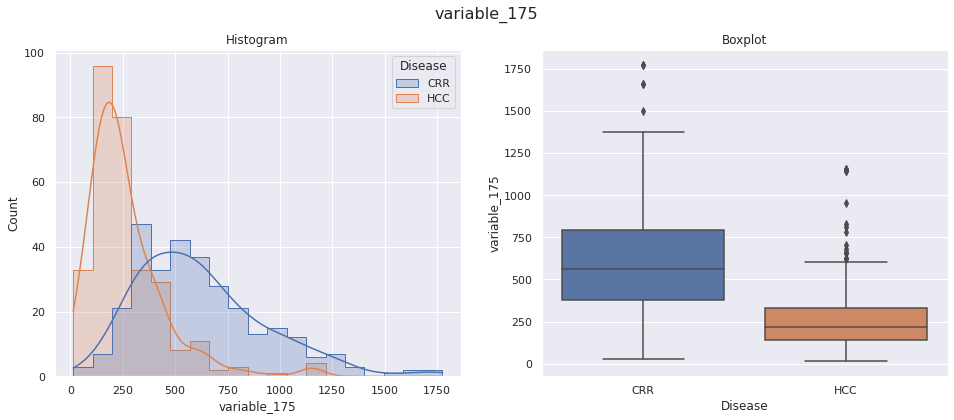

------------------------------------------------------------------------------------------------------------------------ 

######################################################################################################################################################


In [25]:
plot_hist_boxplot_distributions(X_remove_corr, target, list_features=list_features)

# 3 - Impute missing values

In [26]:
from missing_value_imputation_functions import *

### We observed before that missing values are here 0's. For further analysis, we prefer to avoid having 0's for mathematical purposes, we can replace these zeros by other values

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 780
- Percent of missing values : 0.44%



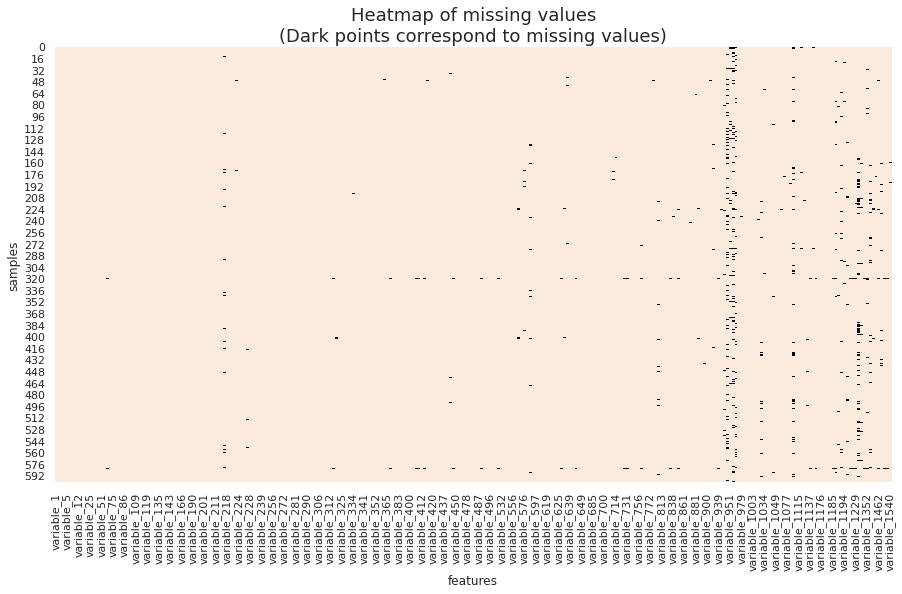

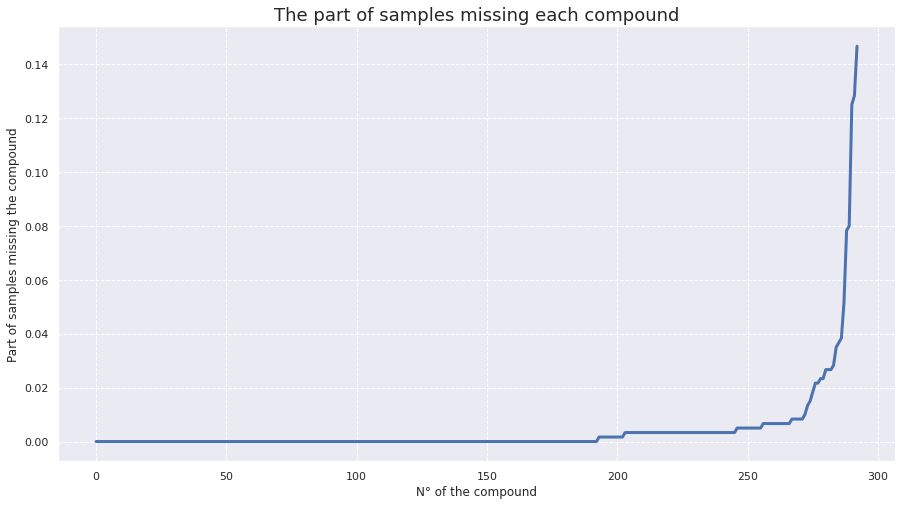



######################################################################################################################################################


In [27]:
plot_infos_missing_values(X_remove_corr, na_values=0)

### Set 0 to NaN to then impute with chosen imputer

In [28]:
X_with_Nan = X_remove_corr.copy()
X_with_Nan[X_with_Nan == 0] = np.nan

## a - Impute intensities with 1's

In [29]:
X_remove_corr_imp_1 = const_imputer(X_with_Nan, 1)
X_remove_corr_imp_1

,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_9,variable_10,variable_12,variable_16,...,variable_1323,variable_1352,variable_1363,variable_1383,variable_1415,variable_1462,variable_1524,variable_1528,variable_1533,variable_1540
0,338.456110,178.997547,1364.243610,178.566806,1260.377806,44.344496,161.102598,2547.881096,11588.670641,642.895680,...,2342.225352,93.637941,135.740580,144.399247,70.939871,34.230355,9.317409,330.902976,110.060420,12.914492
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,92.467096,1443.736018,7506.235783,378.804289,...,1051.366461,50.440223,265.663987,73.039082,55.239880,15.842787,112.927400,180.437923,53.271213,118.352041
2,366.706487,259.462600,802.787197,120.202964,788.551524,9.570326,553.027989,1797.210358,9122.852120,313.832971,...,1645.522055,37.363932,6231.880196,163.883190,889.788269,1538.069893,441.556077,359.139706,336.165316,433.291420
3,630.968755,247.373452,644.469610,126.616534,691.180244,16.854885,428.524942,1689.620044,8651.959451,181.063777,...,1243.435039,7.057389,1586.247463,123.219385,469.967924,1062.700095,111.584693,371.615699,223.423291,206.703846
4,316.203152,165.324430,858.162423,63.108923,972.719569,18.614440,651.571161,607.654172,10585.652292,238.982625,...,1557.929503,14.252545,1806.693220,265.664951,645.723732,2185.034822,269.070700,1033.820892,389.472377,692.609969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,643.700607,81.726317,44.298642,116.982461,119.174566,72.642404,3.171222,262.666861,2035.671947,15.886810,...,76.182141,12.108396,310.592271,23.653173,90.760722,0.231091,115.487994,87.505753,13.689649,122.634629
596,138.210427,50.414871,90.982461,35.704599,175.506588,2.650791,83.308540,88.486708,1005.482356,12.539922,...,71.017145,17.150164,145.198646,149.334740,87.697206,448.532945,53.358525,75.747775,40.250550,57.360363
597,580.244633,349.744638,104.137371,254.813580,158.453363,179.001723,23.876031,475.352721,1780.862860,52.026375,...,504.195020,36.241334,2938.202038,80.287923,54.003996,2.524895,129.468179,210.178214,26.026989,274.814748
598,582.544934,257.779379,92.690730,199.052746,115.963688,138.686838,21.925505,359.996650,1109.528784,43.556516,...,304.821008,19.922244,2118.235056,55.036961,62.245614,2.471958,105.561574,166.763694,9.861801,224.970772


## b - Impute intensities with half minimum value in features

In [30]:
X_remove_corr_imp_halfmin = half_min_imputer(X_with_Nan)
X_remove_corr_imp_halfmin

,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_9,variable_10,variable_12,variable_16,...,variable_1323,variable_1352,variable_1363,variable_1383,variable_1415,variable_1462,variable_1524,variable_1528,variable_1533,variable_1540
0,338.456110,178.997547,1364.243610,178.566806,1260.377806,44.344496,161.102598,2547.881096,11588.670641,642.895680,...,2342.225352,93.637941,135.740580,144.399247,70.939871,34.230355,9.317409,330.902976,110.060420,12.914492
1,587.927618,129.710850,594.600666,145.488720,896.401881,27.842101,92.467096,1443.736018,7506.235783,378.804289,...,1051.366461,50.440223,265.663987,73.039082,55.239880,15.842787,112.927400,180.437923,53.271213,118.352041
2,366.706487,259.462600,802.787197,120.202964,788.551524,9.570326,553.027989,1797.210358,9122.852120,313.832971,...,1645.522055,37.363932,6231.880196,163.883190,889.788269,1538.069893,441.556077,359.139706,336.165316,433.291420
3,630.968755,247.373452,644.469610,126.616534,691.180244,16.854885,428.524942,1689.620044,8651.959451,181.063777,...,1243.435039,7.057389,1586.247463,123.219385,469.967924,1062.700095,111.584693,371.615699,223.423291,206.703846
4,316.203152,165.324430,858.162423,63.108923,972.719569,18.614440,651.571161,607.654172,10585.652292,238.982625,...,1557.929503,14.252545,1806.693220,265.664951,645.723732,2185.034822,269.070700,1033.820892,389.472377,692.609969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,643.700607,81.726317,44.298642,116.982461,119.174566,72.642404,3.171222,262.666861,2035.671947,15.886810,...,76.182141,12.108396,310.592271,23.653173,90.760722,0.231091,115.487994,87.505753,13.689649,122.634629
596,138.210427,50.414871,90.982461,35.704599,175.506588,2.650791,83.308540,88.486708,1005.482356,12.539922,...,71.017145,17.150164,145.198646,149.334740,87.697206,448.532945,53.358525,75.747775,40.250550,57.360363
597,580.244633,349.744638,104.137371,254.813580,158.453363,179.001723,23.876031,475.352721,1780.862860,52.026375,...,504.195020,36.241334,2938.202038,80.287923,54.003996,2.524895,129.468179,210.178214,26.026989,274.814748
598,582.544934,257.779379,92.690730,199.052746,115.963688,138.686838,21.925505,359.996650,1109.528784,43.556516,...,304.821008,19.922244,2118.235056,55.036961,62.245614,2.471958,105.561574,166.763694,9.861801,224.970772


### We can check that there is no more missing values in the imputed peak tables

In [31]:
plot_infos_missing_values(X_remove_corr_imp_1, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

In [32]:
plot_infos_missing_values(X_remove_corr_imp_halfmin, na_values=0)

######################################################################################################################################################
Considering 0 as missing values :
- Total number of missing values : 0
- Percent of missing values : 0.00%



0

## c - PCA

In [33]:
if plot_infos_missing_values(X_remove_corr_imp_1, na_values=0, plot=False) == 0:
    cb.plot.pca(X_remove_corr_imp_1, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

Loading BokehJS ...

In [34]:
if plot_infos_missing_values(X_remove_corr_imp_1, na_values=0, plot=False) == 0:
    PCA_3D(X_remove_corr_imp_1, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

# 4 - Transformations

In [35]:
from normalisation_scaling_functions import *

## a - log transformation

In [36]:
#X_remove_corr_imp_1_log = normPeakTable(X_remove_corr_imp_1, 'log10', based='metabolite')
#X_remove_corr_imp_1_log

## b - Standard scale intensities

In [37]:
X_remove_corr_imp_1_std = normPeakTable(X_remove_corr_imp_1, 'autoscaling', based='metabolites')
X_remove_corr_imp_1_std

,variable_1,variable_2,variable_3,variable_4,variable_5,variable_6,variable_9,variable_10,variable_12,variable_16,...,variable_1323,variable_1352,variable_1363,variable_1383,variable_1415,variable_1462,variable_1524,variable_1528,variable_1533,variable_1540
0,-0.768778,0.077430,5.362817,-0.186013,2.832108,-0.608372,-0.027604,4.283705,3.247097,3.612570,...,1.243440,1.589949,-0.457620,-0.445716,-0.635395,-0.663338,-1.122795,-0.250456,0.265540,-1.568190
1,-0.221737,-0.240674,1.561609,-0.289967,1.552066,-0.670423,-0.519382,2.025786,1.465925,1.814319,...,0.012746,0.218157,-0.392712,-0.737958,-0.708678,-0.701808,-0.424510,-0.834437,-0.404333,-1.121612
2,-0.706830,0.596765,2.589826,-0.369433,1.172774,-0.739127,2.780565,2.748623,2.171257,1.371916,...,0.579209,-0.197095,2.587911,-0.365924,3.186781,2.482980,1.790297,-0.140864,2.932623,0.212307
3,-0.127356,0.518739,1.807908,-0.349277,0.830335,-0.711736,1.888493,2.528606,1.965806,0.467865,...,0.195863,-1.159513,0.267030,-0.532454,1.227166,1.488416,-0.433560,-0.092442,1.602743,-0.747400
4,-0.817574,-0.010818,2.863320,-0.548862,1.820462,-0.705120,3.486633,0.316043,2.809479,0.862246,...,0.495699,-0.931023,0.377161,0.050903,2.047550,3.836553,0.627824,2.477692,3.561421,1.310645
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-0.099438,-0.550374,-1.156291,-0.379554,-1.181313,-0.501969,-1.159192,-0.389438,-0.920890,-0.656858,...,-0.916987,-0.999113,-0.370267,-0.940208,-0.542876,-0.734471,-0.407253,-1.195123,-0.871228,-1.103473
596,-1.207876,-0.752463,-0.925724,-0.634986,-0.983203,-0.765145,-0.585004,-0.745628,-1.370363,-0.679648,...,-0.921911,-0.839006,-0.452894,-0.425504,-0.557176,0.203462,-0.825978,-1.240758,-0.557921,-1.379941
597,-0.238584,1.179459,-0.860753,0.053608,-1.043176,-0.102046,-1.010841,0.045493,-1.032063,-0.410777,...,-0.508923,-0.232744,0.942444,-0.708272,-0.714447,-0.729672,-0.313033,-0.719009,-0.725699,-0.458917
598,-0.233540,0.585901,-0.917287,-0.121632,-1.192605,-0.253634,-1.024817,-0.190404,-1.324967,-0.468450,...,-0.699004,-0.750975,0.532802,-0.811682,-0.675977,-0.729782,-0.474153,-0.887509,-0.916380,-0.670030


In [38]:
if plot_infos_missing_values(X_remove_corr_imp_1_std, na_values=0, plot=False) == 0:
    cb.plot.pca(X_remove_corr_imp_1_std, pcx=1, pcy=2, group_label=target)
else:
    print('NaNs in peak table, please impute before using PCA')

/opt/conda/lib/python3.10/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead

/opt/conda/lib/python3.10/site-packages/bokeh/util/deprecation.py:75: BokehDeprecationWarning:

'legend' keyword is deprecated, use explicit 'legend_label', 'legend_field', or 'legend_group' keywords instead



Loading BokehJS ...

In [39]:
if plot_infos_missing_values(X_remove_corr_imp_1_std, na_values=0, plot=False) == 0:
    PCA_3D(X_remove_corr_imp_1_std, peakTable, target.name)
else:
    print('NaNs in peak table, please impute before using PCA')

# 5 - Dimensionality reduction

In [40]:
from dimensionality_reduction_functions import *

## a - PCA then t-SNE

### The point of this step is to reduce dimensionality, argument <code>part_explained_variance</code> can be changed to set the part of initial explained variance we want to keep after reduction. We can also set the <code>n_components</code> argument to keep a specific number of PCA components.

#################################################################################################### 



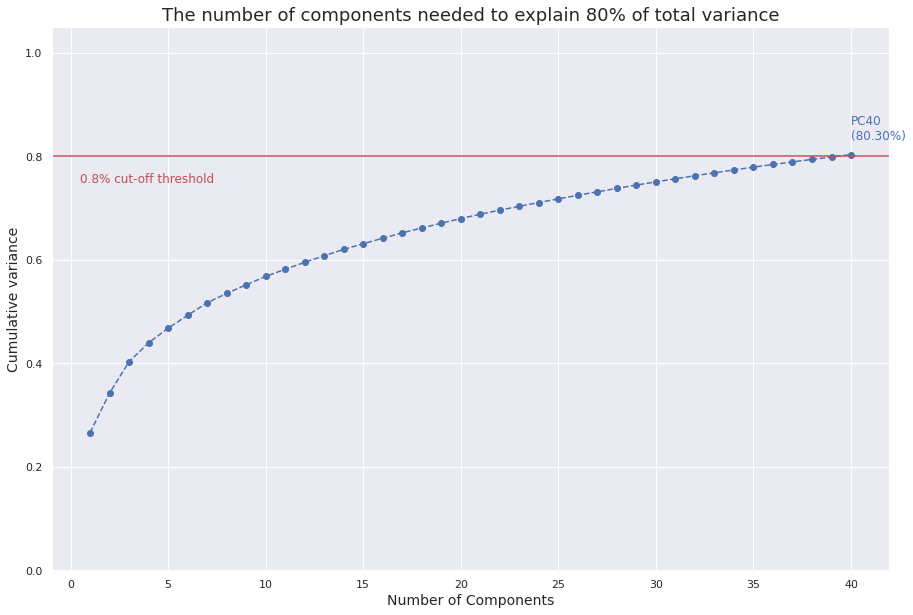

Initial number of dimension : 293
Final number of dimension : 40


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40
0,15.473240,7.455921,23.271289,3.469287,-7.067159,-7.042634,-1.479352,-7.798386,3.138526,11.665781,...,-0.176351,-1.345966,2.634875,-2.353550,-3.843656,-0.184652,-2.902991,1.241628,-2.201504,-0.040009
1,4.960326,3.400771,16.034213,2.078591,-4.405290,-3.097039,-0.729316,-4.677620,2.298025,6.639577,...,-0.577650,-0.634986,0.836691,-1.012253,-1.789088,-0.412139,-1.170422,0.215167,-1.178808,0.059483
2,21.078906,11.723118,1.765331,7.438010,4.056569,-7.376836,-0.533519,-6.545800,1.669257,3.376308,...,-2.323602,-3.976275,-1.577691,-2.109777,1.693109,-0.661142,1.739154,-0.431354,5.244417,-1.607924
3,15.802626,9.567618,2.783934,5.460762,0.872198,-4.234131,-5.020576,-1.299168,2.725854,2.790083,...,-2.971575,-2.099426,-1.789685,-2.561400,0.282138,0.069495,0.779588,1.151721,4.506650,-2.197486
4,15.795005,16.519178,-2.100794,-2.955867,-3.386126,0.562448,-3.434173,-7.308202,-2.815794,5.653339,...,2.860693,0.754064,0.686962,6.492335,-2.162882,0.978315,4.184954,1.417305,-1.439265,-1.629559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-12.733735,-0.961669,0.965239,0.453806,0.186719,0.659176,1.597100,-0.799305,0.602372,-0.119373,...,0.570289,0.282804,-0.231543,-0.117545,-0.279552,-0.229639,0.272162,-0.250252,0.309130,0.117710
596,-10.842940,2.200287,0.191254,-0.499544,0.523811,0.453702,-0.636488,-0.604137,-0.709762,-0.886798,...,-0.897609,0.822720,-0.966595,-0.182035,0.314289,1.180983,0.061665,0.165870,-0.168580,-1.116906
597,-7.188771,-3.473397,0.295334,2.501539,0.185452,1.176488,1.313732,-0.772894,1.623664,-0.994144,...,0.215154,-0.501624,0.557869,-0.298605,-0.089453,-0.978773,0.443267,0.660648,-0.221987,-0.074741
598,-9.389880,-2.549055,0.527083,1.875235,0.340180,1.305865,1.074494,-0.651421,1.235710,-0.928640,...,0.009851,-0.411188,0.279965,-0.255252,-0.194966,-0.771138,0.349695,0.564380,-0.281832,-0.074228



 #################################################################################################### 

Time to compute t-SNE (input dataframe of shape (600, 40)) : 2.20 seconds

----------------------------------------------------------------------------------------------------


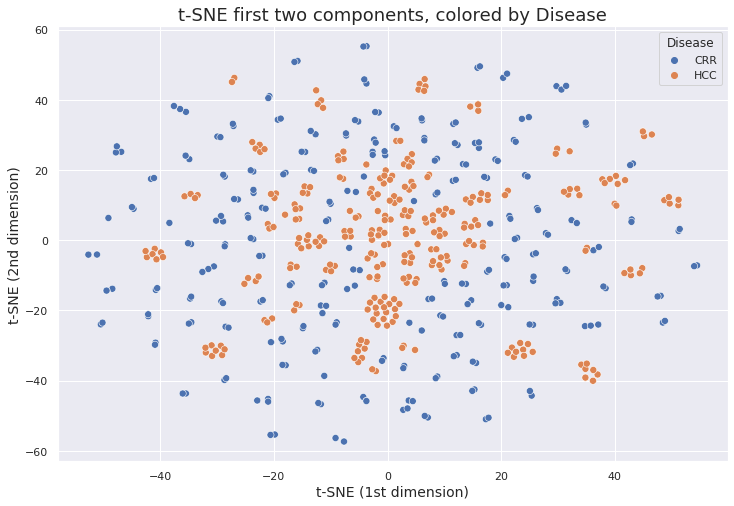

----------------------------------------------------------------------------------------------------


,tSNE1,tSNE2
0,25.030682,-42.963196
1,25.344877,-44.288090
2,48.418716,-23.478210
3,48.791145,-22.986126
4,-3.707644,55.288994
...,...,...
595,14.591836,10.690854
596,-40.677837,-5.451499
597,4.230061,22.189402
598,3.742479,21.014439


In [41]:
# target = 

print(100 * '#', '\n')

matrix = X_remove_corr_imp_1_std.copy()

X_remove_corr_imp_1_std_PCA, explained_variance = perform_PCA(matrix, part_explained_variance=0.8)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {explained_variance.shape[0]}')
display(X_remove_corr_imp_1_std_PCA)

print('\n', 100 * '#', '\n')

n_components = 2
X_remove_corr_imp_1_std_PCA_tSNE = perform_tSNE(X_remove_corr_imp_1_std_PCA, metadata=metadata, n_components=n_components, targets_plot=[target.name])
display(X_remove_corr_imp_1_std_PCA_tSNE)

## b - Feature selection keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$

In [42]:
#target = 
matrix = X_remove_corr_imp_1_std.copy()

X_remove_corr_imp_1_std_fs_anova, feature_scores = select_best_features(matrix, target, alpha=0.01)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_1_std_fs_anova)

Initial number of dimension : 293
Final number of dimension : 286


,features,f_scores,p_values
8,variable_12,579.067,0.0000
146,variable_483,520.658,0.0000
56,variable_211,482.295,0.0000
53,variable_204,421.031,0.0000
18,variable_57,419.849,0.0000
...,...,...,...
258,variable_1111,10.277,0.0014
25,variable_87,10.145,0.0015
93,variable_309,9.091,0.0027
239,variable_960,7.312,0.0070


,variable_12,variable_483,variable_211,variable_204,variable_57,variable_86,variable_5,variable_213,variable_297,variable_191,...,variable_466,variable_888,variable_504,variable_447,variable_99,variable_1111,variable_87,variable_309,variable_960,variable_405
0,3.247097,1.860559,4.282456,0.356398,1.836263,4.473907,2.832108,0.539435,3.908039,3.898138,...,-0.198759,-0.524924,-0.322213,-0.433806,0.612376,-0.717275,-0.603813,-0.746954,-0.698474,0.005083
1,1.465925,0.956211,1.609102,-0.164619,0.321349,2.045894,1.552066,0.832575,1.147186,1.837492,...,-0.117558,-0.575135,-0.328836,-0.615548,-0.101517,-0.717275,-0.680649,-0.713981,-0.795898,-0.117474
2,2.171257,0.417376,1.698212,0.246345,1.668472,1.730951,1.172774,0.400682,1.612332,0.882663,...,-0.201620,1.544786,-0.325406,1.931818,0.058318,1.757919,2.519476,-0.737828,2.387249,0.016905
3,1.965806,0.420235,1.406795,0.213058,1.084849,1.379288,0.830335,1.549605,1.222053,0.745930,...,-0.120376,0.942639,-0.328495,-0.595990,-0.021848,0.291561,2.197593,-0.731102,2.610159,0.044704
4,2.809479,0.529547,1.883352,0.520815,1.641704,1.852224,1.820462,1.317727,1.670514,2.700146,...,-0.207812,0.671826,-0.326674,-0.581584,-0.006513,-0.529423,0.496779,-0.755748,0.167795,-0.097222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-0.920890,-0.775910,-1.110059,-1.060224,-1.231212,-0.705315,-1.181313,-0.760205,-0.738727,-1.364506,...,-0.204993,-0.676536,-0.317349,-0.390750,-0.541073,0.060843,-0.493006,0.372403,-0.650264,-0.237879
596,-1.370363,-0.605026,-1.001674,-0.893477,-0.738672,-0.810251,-0.983203,-1.005948,-1.272553,-1.082152,...,-0.230071,-0.275431,-0.307913,0.138913,0.155850,-0.584148,-0.631337,-0.663455,-0.756503,-0.236956
597,-1.032063,-1.367691,-0.552526,-0.992766,-0.882724,-0.477666,-1.043176,-0.248781,-0.841687,-1.032160,...,-0.083362,-0.670917,-0.253858,0.438141,-0.103526,0.140369,-0.515254,1.267464,-0.605103,-0.097021
598,-1.324967,-1.443401,-0.888204,-1.083873,-1.077211,-0.708175,-1.192605,-0.519784,-0.851843,-1.000042,...,-0.128707,-0.671817,-0.265380,0.045204,-0.153330,0.007875,-0.582977,0.461341,-0.702826,-0.184497


## c - Feature selection keeping a specific number of features

### Keeping 50 features

In [80]:
#target = 
matrix = X_remove_corr_imp_1_std.copy()

X_remove_corr_imp_1_std_fs_nb_50, feature_scores = select_best_features(matrix, target, k=50)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_1_std_fs_nb_50)

Initial number of dimension : 293
Final number of dimension : 50


,features,f_scores,p_values
8,variable_12,579.07,0.00
146,variable_483,520.66,0.00
56,variable_211,482.30,0.00
53,variable_204,421.03,0.00
18,variable_57,419.85,0.00
24,variable_86,412.57,0.00
4,variable_5,402.61,0.00
58,variable_213,400.91,0.00
90,variable_297,362.82,0.00
49,variable_191,347.70,0.00


,variable_12,variable_483,variable_211,variable_204,variable_57,variable_86,variable_5,variable_213,variable_297,variable_191,...,variable_411,variable_1033,variable_246,variable_1528,variable_813,variable_881,variable_601,variable_731,variable_189,variable_702
0,3.25,1.86,4.28,0.36,1.84,4.47,2.83,0.54,3.91,3.90,...,-1.38,2.11,-0.56,-0.25,-1.19,-0.95,1.69,-1.00,2.35,-1.26
1,1.47,0.96,1.61,-0.16,0.32,2.05,1.55,0.83,1.15,1.84,...,-1.29,0.89,-0.31,-0.83,-1.06,-0.45,0.37,-0.85,1.42,-1.01
2,2.17,0.42,1.70,0.25,1.67,1.73,1.17,0.40,1.61,0.88,...,-0.20,2.65,1.08,-0.14,2.34,0.33,1.35,0.07,1.02,0.30
3,1.97,0.42,1.41,0.21,1.08,1.38,0.83,1.55,1.22,0.75,...,0.03,1.36,-0.24,-0.09,1.53,-1.30,0.62,0.38,0.90,-0.85
4,2.81,0.53,1.88,0.52,1.64,1.85,1.82,1.32,1.67,2.70,...,-0.94,2.93,0.51,2.48,1.68,-0.48,0.94,-0.24,3.54,-0.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-0.92,-0.78,-1.11,-1.06,-1.23,-0.71,-1.18,-0.76,-0.74,-1.36,...,-1.04,-0.83,-1.12,-1.20,-1.25,-1.06,-1.07,-1.33,-1.05,-0.86
596,-1.37,-0.61,-1.00,-0.89,-0.74,-0.81,-0.98,-1.01,-1.27,-1.08,...,-0.89,-0.86,-0.99,-1.24,-0.95,-0.84,-0.47,-0.41,-0.26,-0.86
597,-1.03,-1.37,-0.55,-0.99,-0.88,-0.48,-1.04,-0.25,-0.84,-1.03,...,-0.09,-0.46,-0.77,-0.72,-0.81,-1.00,-0.80,-0.11,-0.86,0.33
598,-1.32,-1.44,-0.89,-1.08,-1.08,-0.71,-1.19,-0.52,-0.85,-1.00,...,-0.15,-0.58,-0.94,-0.89,-0.96,-1.15,-0.98,-0.31,-0.87,-0.18


######################################################################################################################################################


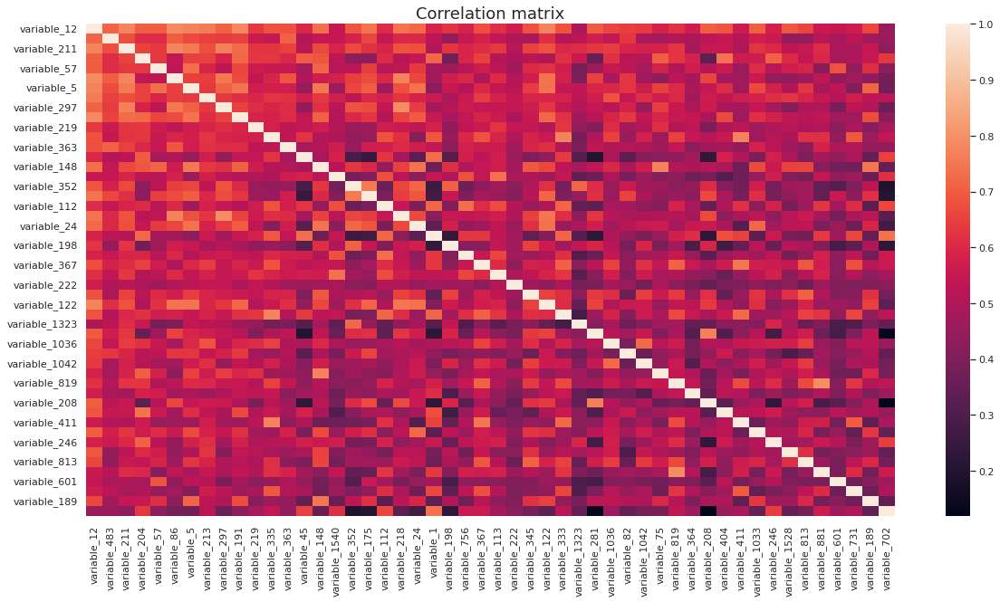

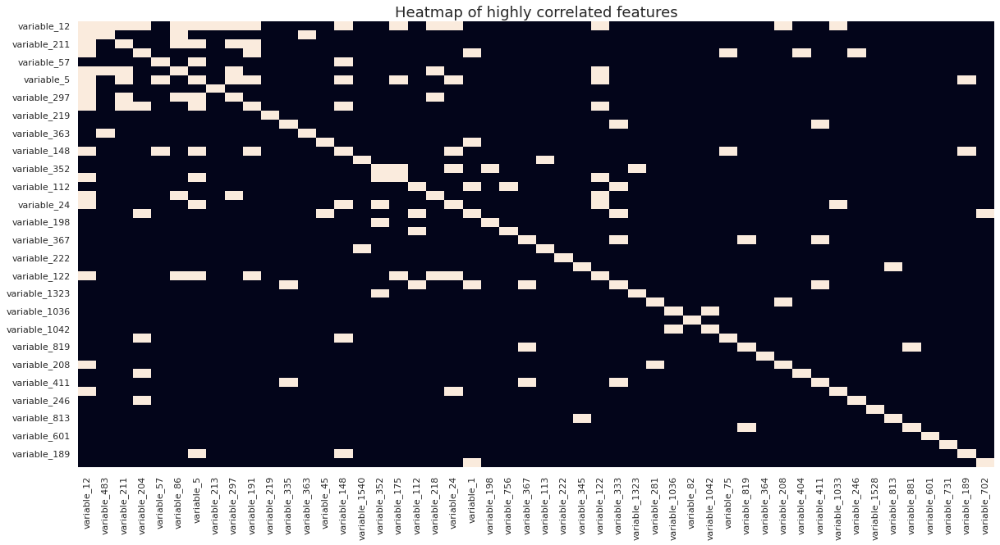



###################################################################################################################################################### 



In [83]:
matrix = pd.concat([target, X_remove_corr_imp_1_std_fs_nb_50], axis=1)
plot_correlation_matrix(matrix, threshold=0.7)

### Keeping 10 features

In [43]:
#target = 
matrix = X_remove_corr_imp_1_std.copy()

X_remove_corr_imp_1_std_fs_nb_10, feature_scores = select_best_features(matrix, target, k=10)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_1_std_fs_nb_10)

Initial number of dimension : 293
Final number of dimension : 10


,features,f_scores,p_values
8,variable_12,579.067,0.0
146,variable_483,520.658,0.0
56,variable_211,482.295,0.0
53,variable_204,421.031,0.0
18,variable_57,419.849,0.0
24,variable_86,412.567,0.0
4,variable_5,402.611,0.0
58,variable_213,400.906,0.0
90,variable_297,362.819,0.0
49,variable_191,347.699,0.0


,variable_12,variable_483,variable_211,variable_204,variable_57,variable_86,variable_5,variable_213,variable_297,variable_191
0,3.247097,1.860559,4.282456,0.356398,1.836263,4.473907,2.832108,0.539435,3.908039,3.898138
1,1.465925,0.956211,1.609102,-0.164619,0.321349,2.045894,1.552066,0.832575,1.147186,1.837492
2,2.171257,0.417376,1.698212,0.246345,1.668472,1.730951,1.172774,0.400682,1.612332,0.882663
3,1.965806,0.420235,1.406795,0.213058,1.084849,1.379288,0.830335,1.549605,1.222053,0.745930
4,2.809479,0.529547,1.883352,0.520815,1.641704,1.852224,1.820462,1.317727,1.670514,2.700146
...,...,...,...,...,...,...,...,...,...,...
595,-0.920890,-0.775910,-1.110059,-1.060224,-1.231212,-0.705315,-1.181313,-0.760205,-0.738727,-1.364506
596,-1.370363,-0.605026,-1.001674,-0.893477,-0.738672,-0.810251,-0.983203,-1.005948,-1.272553,-1.082152
597,-1.032063,-1.367691,-0.552526,-0.992766,-0.882724,-0.477666,-1.043176,-0.248781,-0.841687,-1.032160
598,-1.324967,-1.443401,-0.888204,-1.083873,-1.077211,-0.708175,-1.192605,-0.519784,-0.851843,-1.000042


######################################################################################################################################################


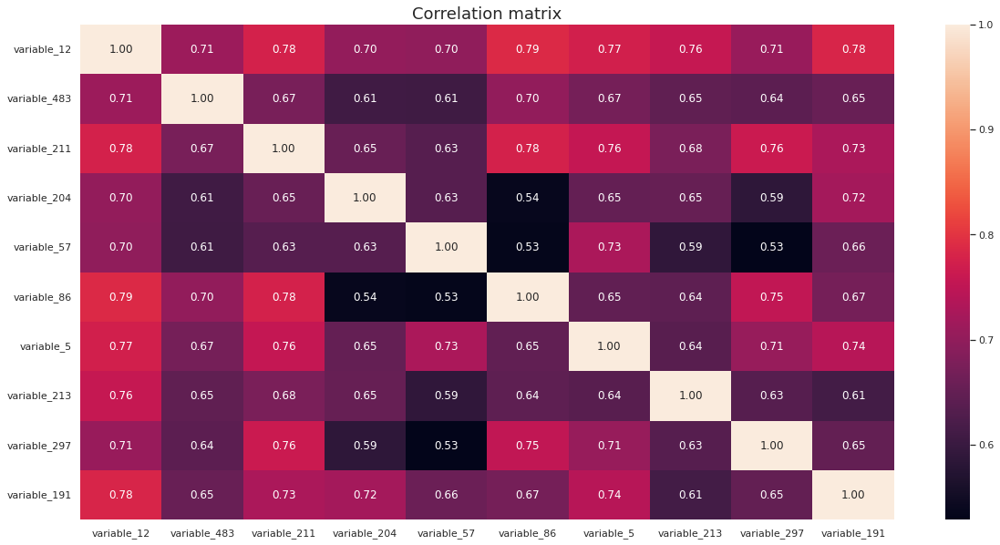

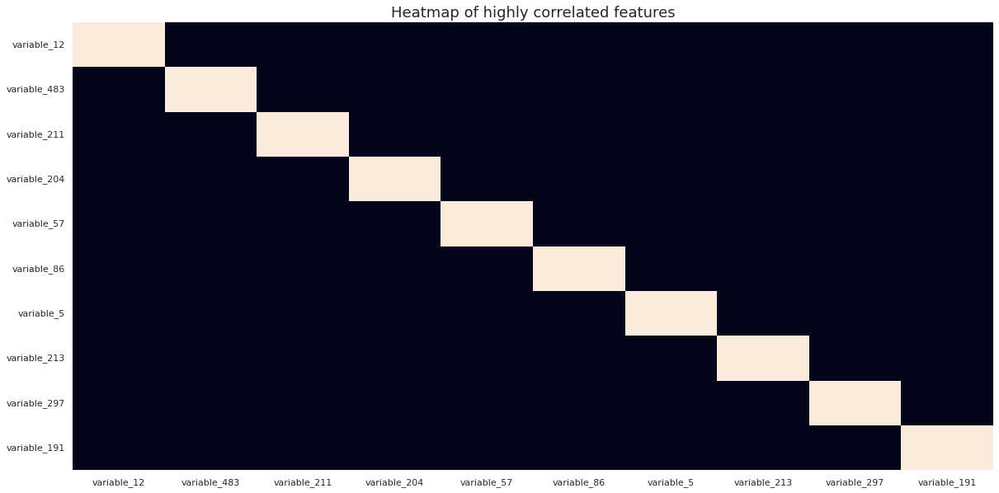



###################################################################################################################################################### 



In [44]:
matrix = pd.concat([target, X_remove_corr_imp_1_std_fs_nb_10], axis=1)
plot_correlation_matrix(matrix, threshold=0.9, annot=True, fmt='.2f')

### Keeping 5 features

In [45]:
#target = peakTable['Disease']
matrix = X_remove_corr_imp_1_std.copy()

X_remove_corr_imp_1_std_fs_nb_5, feature_scores = select_best_features(matrix, target, k=5)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_1_std_fs_nb_5)

Initial number of dimension : 293
Final number of dimension : 5


,features,f_scores,p_values
8,variable_12,579.067,0.0
146,variable_483,520.658,0.0
56,variable_211,482.295,0.0
53,variable_204,421.031,0.0
18,variable_57,419.849,0.0


,variable_12,variable_483,variable_211,variable_204,variable_57
0,3.247097,1.860559,4.282456,0.356398,1.836263
1,1.465925,0.956211,1.609102,-0.164619,0.321349
2,2.171257,0.417376,1.698212,0.246345,1.668472
3,1.965806,0.420235,1.406795,0.213058,1.084849
4,2.809479,0.529547,1.883352,0.520815,1.641704
...,...,...,...,...,...
595,-0.920890,-0.775910,-1.110059,-1.060224,-1.231212
596,-1.370363,-0.605026,-1.001674,-0.893477,-0.738672
597,-1.032063,-1.367691,-0.552526,-0.992766,-0.882724
598,-1.324967,-1.443401,-0.888204,-1.083873,-1.077211


######################################################################################################################################################


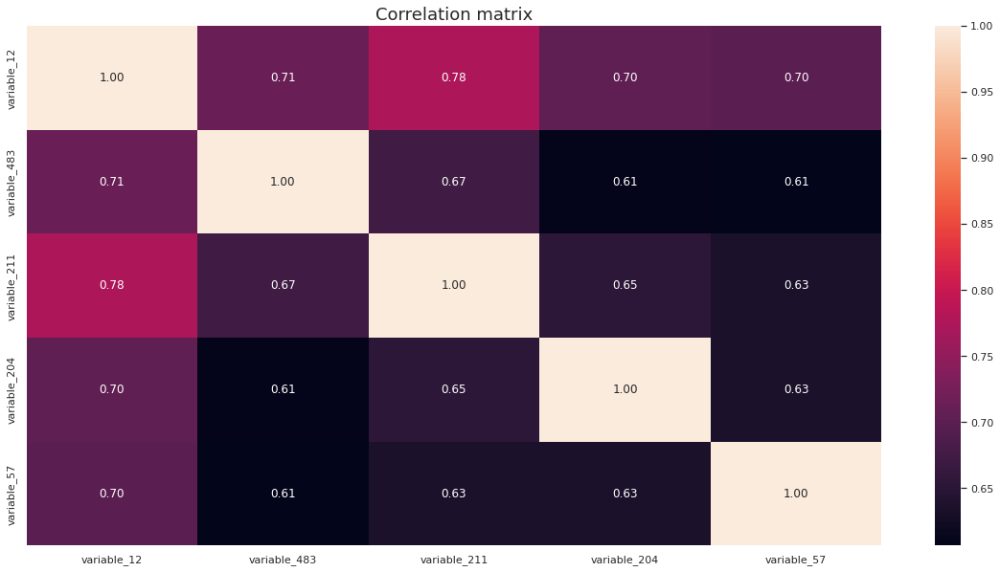

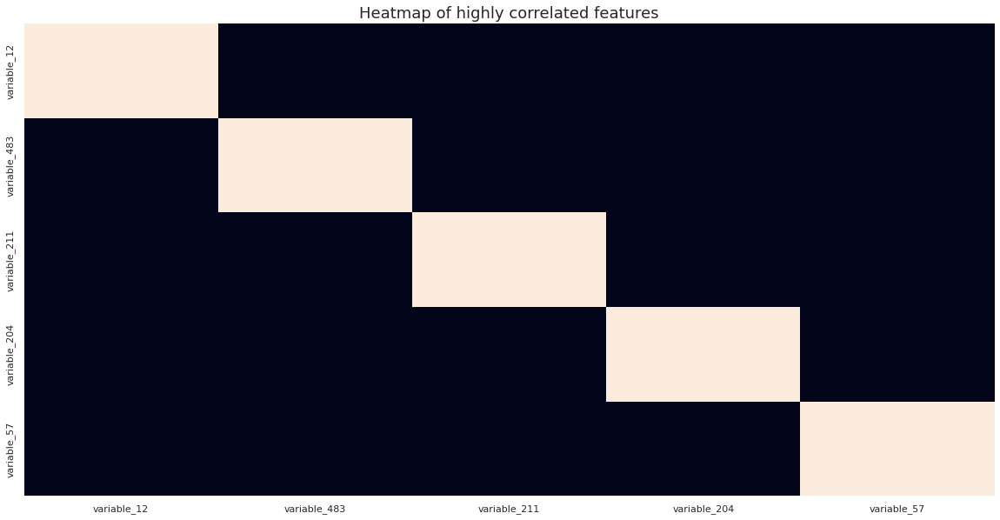



###################################################################################################################################################### 



In [46]:
matrix = pd.concat([target, X_remove_corr_imp_1_std_fs_nb_5], axis=1)
plot_correlation_matrix(matrix, threshold=0.9, annot=True, fmt='.2f')

### Keeping 1 feature

In [47]:
#target = 
matrix = X_remove_corr_imp_1_std.copy()

X_remove_corr_imp_1_std_fs_nb_1, feature_scores = select_best_features(matrix, target, k=1)
print(f'Initial number of dimension : {matrix.shape[1]}')
print(f'Final number of dimension : {feature_scores.shape[0]}')
display(feature_scores)
display(X_remove_corr_imp_1_std_fs_nb_1)

Initial number of dimension : 293
Final number of dimension : 1


,features,f_scores,p_values
8,variable_12,579.067,0.0


,variable_12
0,3.247097
1,1.465925
2,2.171257
3,1.965806
4,2.809479
...,...
595,-0.920890
596,-1.370363
597,-1.032063
598,-1.324967


#### For further analysis, we have the following reduced dataframes :
- <code>X_remove_corr_imp_1_std_PCA</code> : reduced peak table with PCA keeping 95% of initial explained variance
- <code>X_remove_corr_imp_1_std_PCA_tSNE</code> : reduced peak table with PCA as before + t-SNE reduction to keep only 2 components
- <code>X_remove_corr_imp_1_std_fs_nb_anova</code> : reduced peak table by keeping all features with ANOVA pvalue $\lt \alpha \hspace{0.39cm}$
- <code>X_remove_corr_imp_1_std_fs_nb_*N*</code> : reduced peak table by keeping a specific number of features (with $N=\{1;5;10\}$ here)

# 6 - Classification

In [48]:
from classification_functions import *

In [49]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression, SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import LeaveOneOut

## a - Launch pipeline with differently preprocessed dataframes

In [50]:
target

0      CRR
1      CRR
2      CRR
3      CRR
4      CRR
      ... 
595    HCC
596    HCC
597    HCC
598    HCC
599    HCC
Name: Disease, Length: 600, dtype: object

### with <code>X_remove_corr_imp_1_std_fs_nb_50</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,52,8
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.87,0.87,60.00
HCC,0.87,0.88,0.88,60.00
accuracy,0.88,0.88,0.88,0.88
macro avg,0.88,0.88,0.87,120.00
weighted avg,0.88,0.88,0.87,120.00


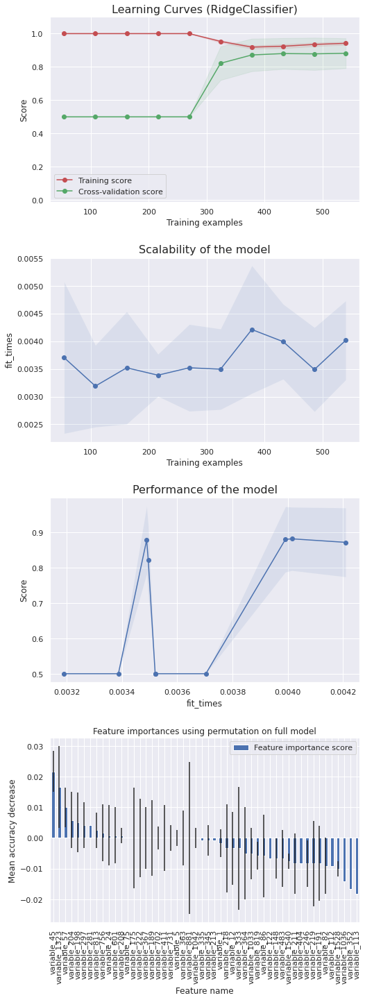




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.90,0.89,60.00
HCC,0.90,0.88,0.89,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.89,0.89,0.89,120.00
weighted avg,0.89,0.89,0.89,120.00


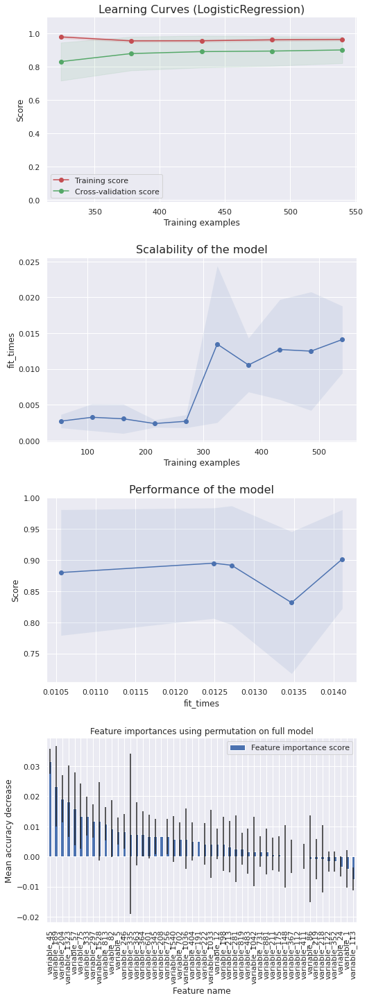




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,52,8
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.87,0.87,60.00
HCC,0.87,0.88,0.88,60.00
accuracy,0.88,0.88,0.88,0.88
macro avg,0.88,0.88,0.87,120.00
weighted avg,0.88,0.88,0.87,120.00


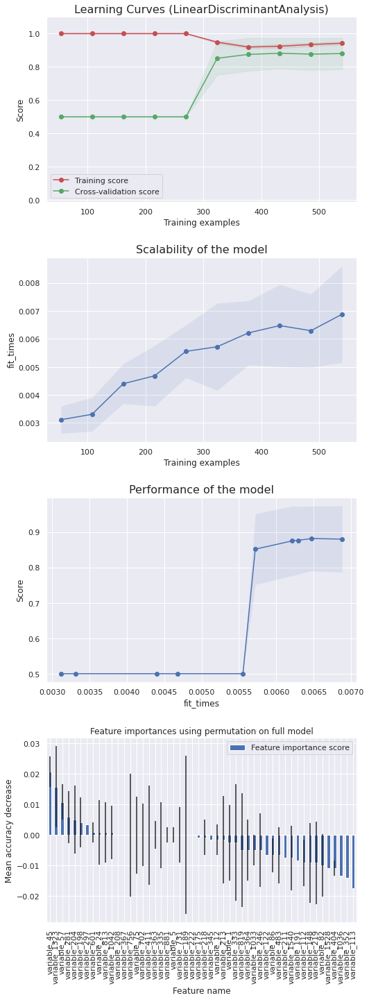




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,55,5
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.92,0.89,60.00
HCC,0.91,0.85,0.88,60.00
accuracy,0.88,0.88,0.88,0.88
macro avg,0.89,0.88,0.88,120.00
weighted avg,0.89,0.88,0.88,120.00


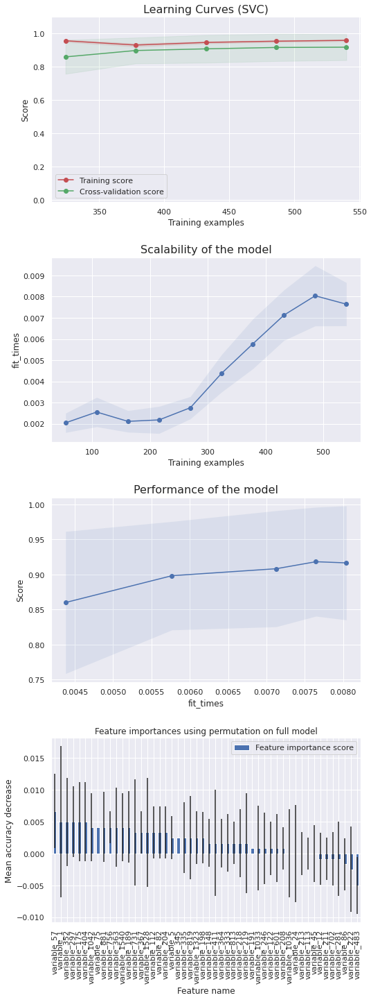




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.88,0.88,60.00
HCC,0.88,0.88,0.88,60.00
accuracy,0.88,0.88,0.88,0.88
macro avg,0.88,0.88,0.88,120.00
weighted avg,0.88,0.88,0.88,120.00


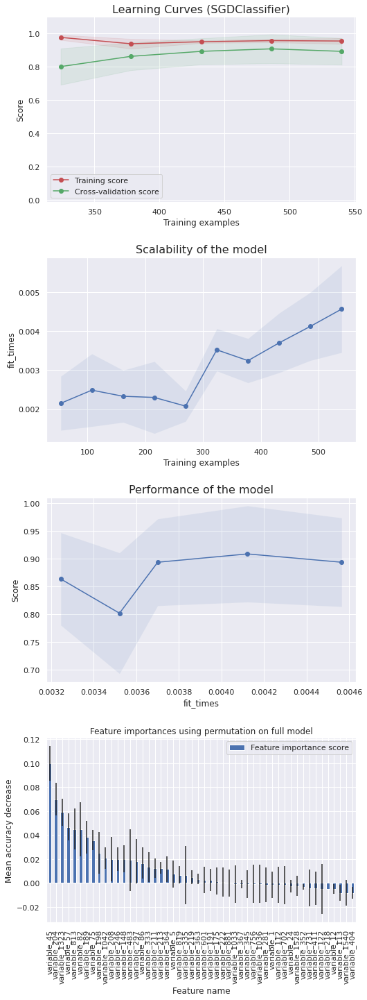




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,59,1
HCC,6,54



Classification report :


,precision,recall,f1-score,support
CRR,0.91,0.98,0.94,60.00
HCC,0.98,0.90,0.94,60.00
accuracy,0.94,0.94,0.94,0.94
macro avg,0.94,0.94,0.94,120.00
weighted avg,0.94,0.94,0.94,120.00


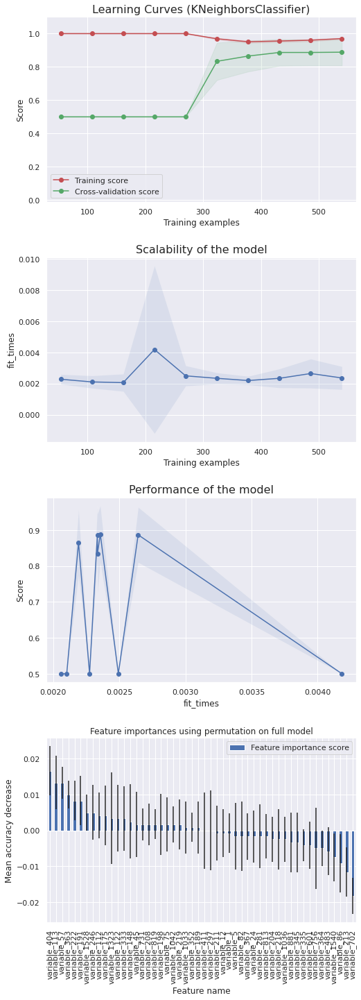




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,52,8
HCC,11,49



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.87,0.85,60.00
HCC,0.86,0.82,0.84,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.84,0.84,120.00
weighted avg,0.84,0.84,0.84,120.00


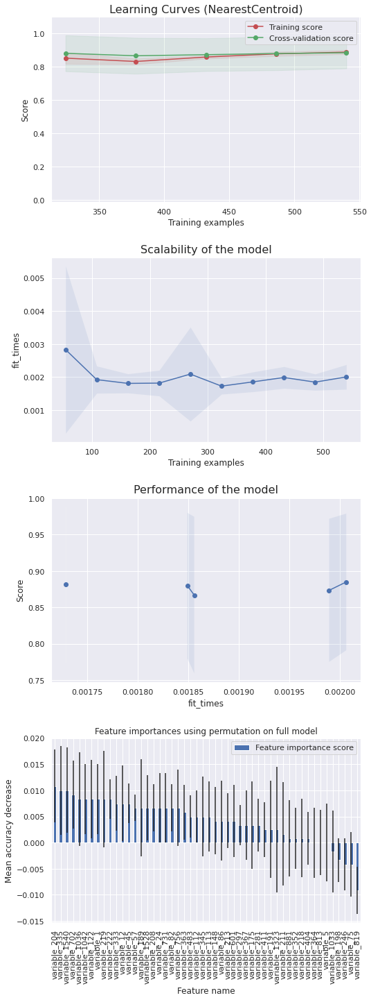




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,55,5
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.87,0.92,0.89,60.00
HCC,0.91,0.87,0.89,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.89,0.89,0.89,120.00
weighted avg,0.89,0.89,0.89,120.00


/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


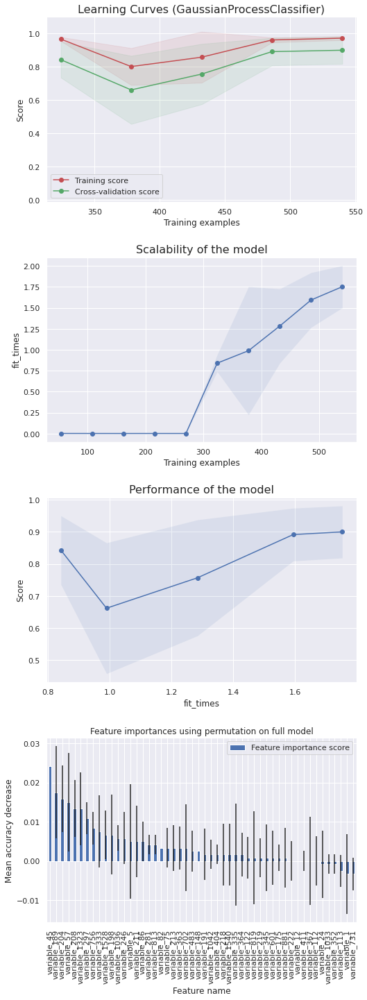




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,15,45



Classification report :


,precision,recall,f1-score,support
CRR,0.78,0.90,0.84,60.00
HCC,0.88,0.75,0.81,60.00
accuracy,0.82,0.82,0.82,0.82
macro avg,0.83,0.82,0.82,120.00
weighted avg,0.83,0.82,0.82,120.00


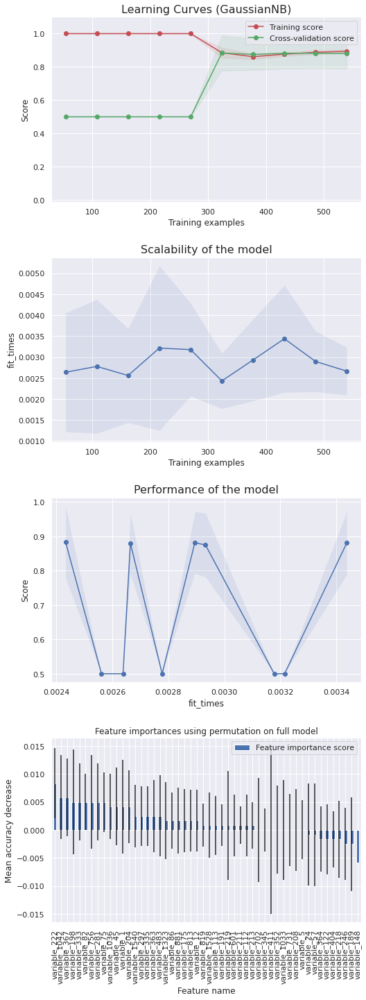




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.85,0.86,60.00
HCC,0.85,0.88,0.87,60.00
accuracy,0.87,0.87,0.87,0.87
macro avg,0.87,0.87,0.87,120.00
weighted avg,0.87,0.87,0.87,120.00


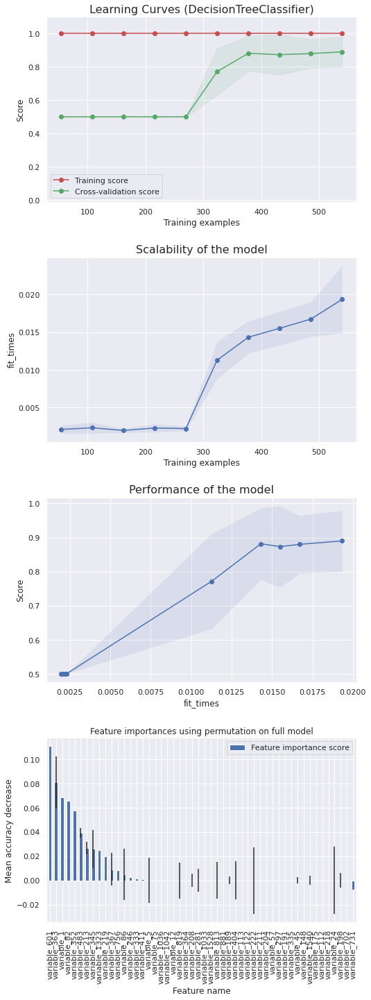




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.95,0.91,60.00
HCC,0.95,0.87,0.90,60.00
accuracy,0.91,0.91,0.91,0.91
macro avg,0.91,0.91,0.91,120.00
weighted avg,0.91,0.91,0.91,120.00


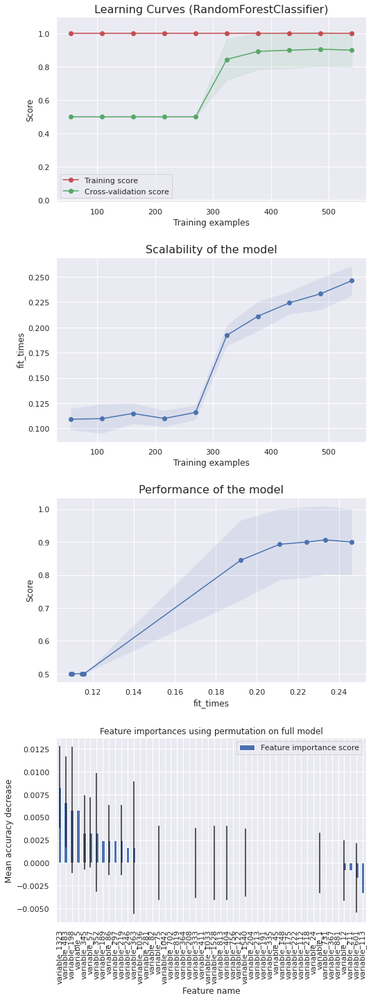




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.95,0.90,60.00
HCC,0.94,0.85,0.89,60.00
accuracy,0.90,0.90,0.90,0.90
macro avg,0.90,0.90,0.90,120.00
weighted avg,0.90,0.90,0.90,120.00


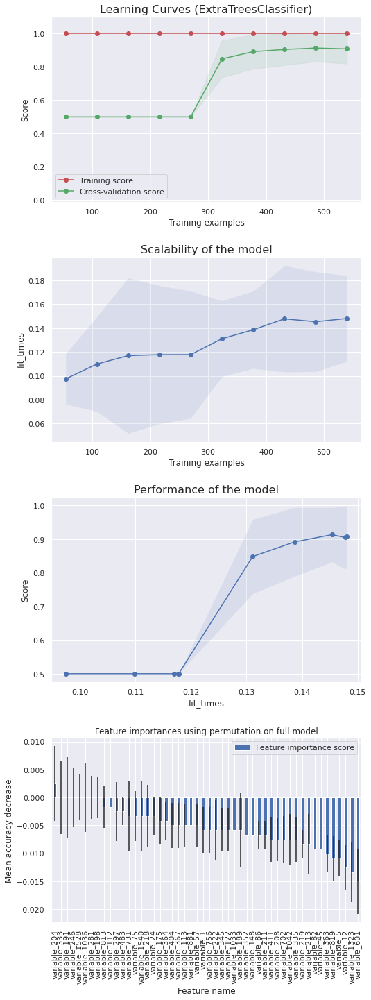




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,55,5
HCC,6,54



Classification report :


,precision,recall,f1-score,support
CRR,0.90,0.92,0.91,60.00
HCC,0.92,0.90,0.91,60.00
accuracy,0.91,0.91,0.91,0.91
macro avg,0.91,0.91,0.91,120.00
weighted avg,0.91,0.91,0.91,120.00


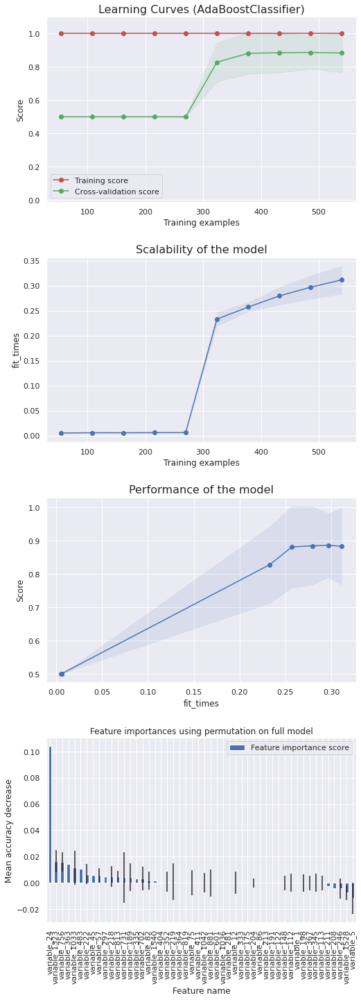




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,6,54



Classification report :


,precision,recall,f1-score,support
CRR,0.90,0.88,0.89,60.00
HCC,0.89,0.90,0.89,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.89,0.89,0.89,120.00
weighted avg,0.89,0.89,0.89,120.00


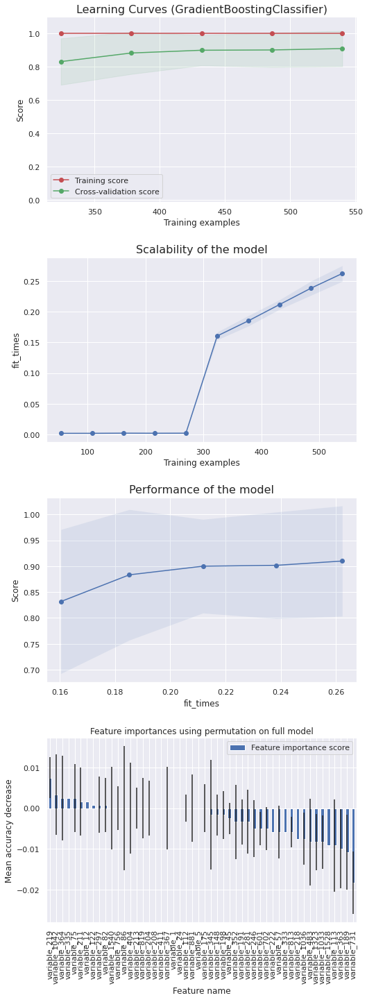




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.95,0.92,60.00
HCC,0.95,0.88,0.91,60.00
accuracy,0.92,0.92,0.92,0.92
macro avg,0.92,0.92,0.92,120.00
weighted avg,0.92,0.92,0.92,120.00


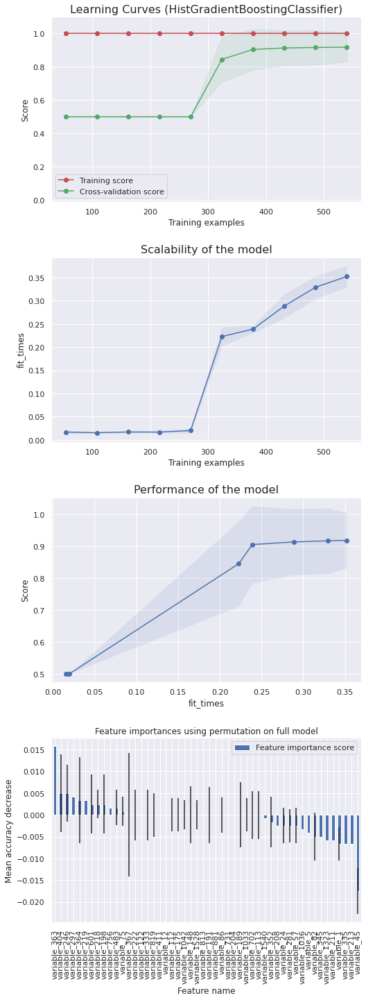




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,55,5
HCC,6,54



Classification report :


,precision,recall,f1-score,support
CRR,0.90,0.92,0.91,60.00
HCC,0.92,0.90,0.91,60.00
accuracy,0.91,0.91,0.91,0.91
macro avg,0.91,0.91,0.91,120.00
weighted avg,0.91,0.91,0.91,120.00


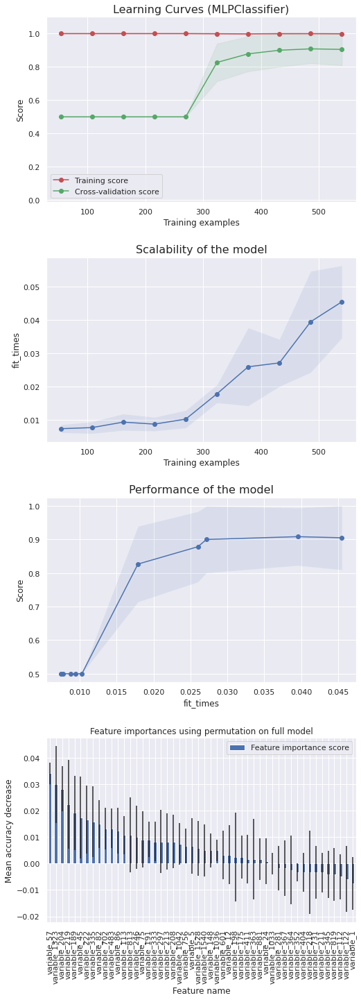




###################################################################################################################################################### 



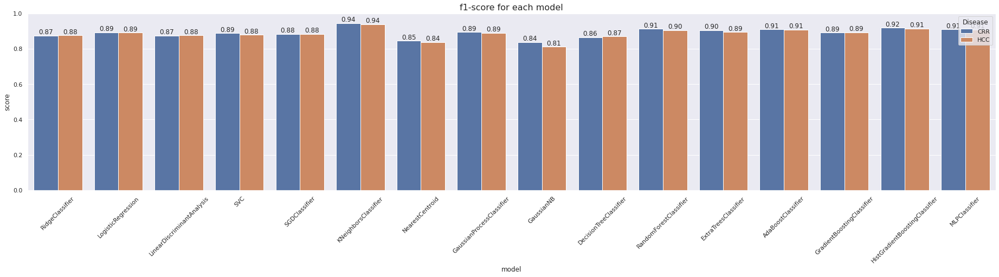


 ######################################################################################################################################################

Time to compute : 00h01m46s

 ######################################################################################################################################################






In [84]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_1_std_fs_nb_50, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=10)

In [85]:
print()

#### For most models, we can observe a gap between training and validation curves, meaning our models cannot generalise the fit from training set on validation set. One solution could be to reduce the number of features

### with <code>X_remove_corr_imp_1_std_fs_nb_10</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.85,0.84,60.00
HCC,0.85,0.83,0.84,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.84,0.84,120.00
weighted avg,0.84,0.84,0.84,120.00


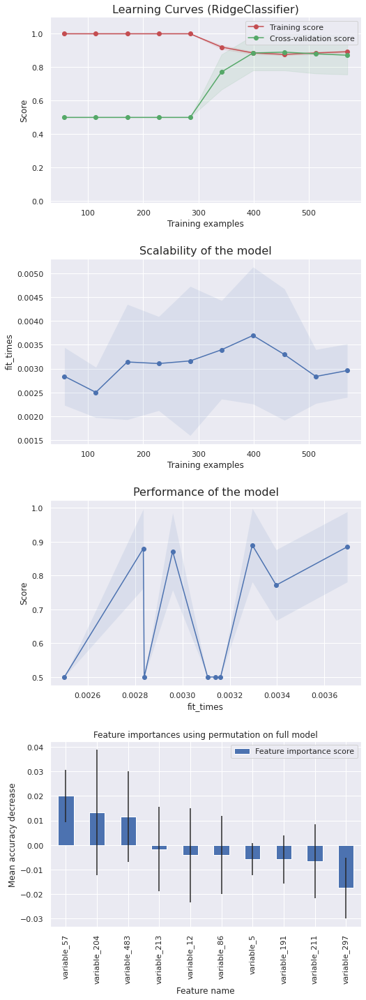




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.85,0.88,0.87,60.00
HCC,0.88,0.85,0.86,60.00
accuracy,0.87,0.87,0.87,0.87
macro avg,0.87,0.87,0.87,120.00
weighted avg,0.87,0.87,0.87,120.00


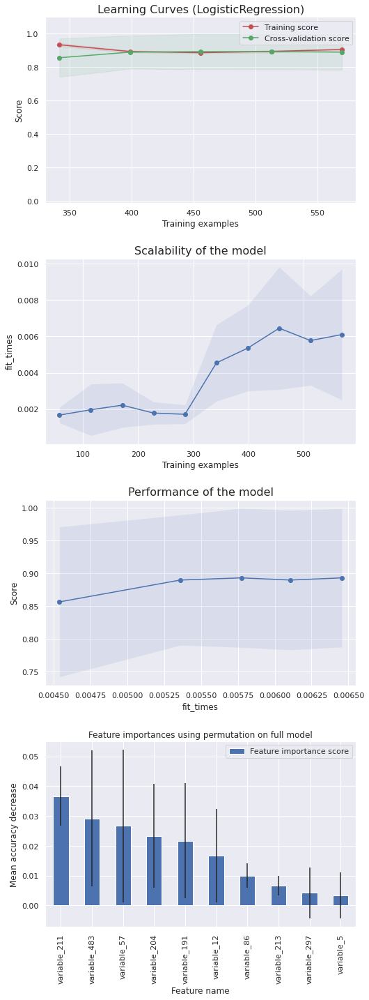




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.85,0.84,60.00
HCC,0.85,0.83,0.84,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.84,0.84,120.00
weighted avg,0.84,0.84,0.84,120.00


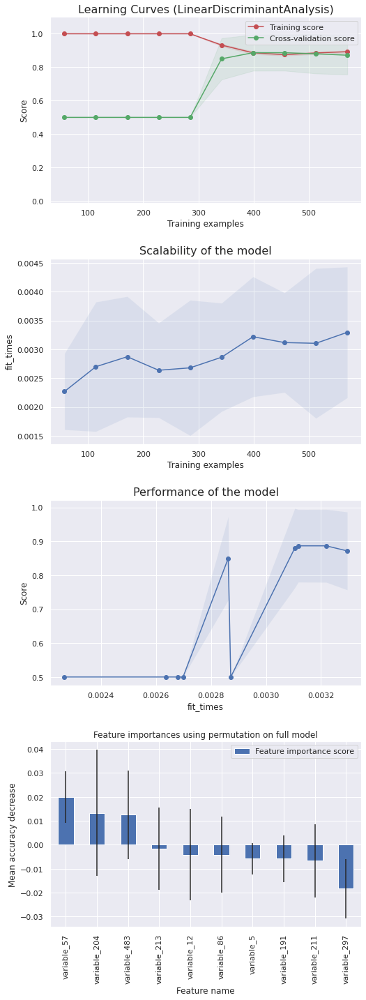




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,13,47



Classification report :


,precision,recall,f1-score,support
CRR,0.81,0.90,0.85,60.00
HCC,0.89,0.78,0.83,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.85,0.84,0.84,120.00
weighted avg,0.85,0.84,0.84,120.00


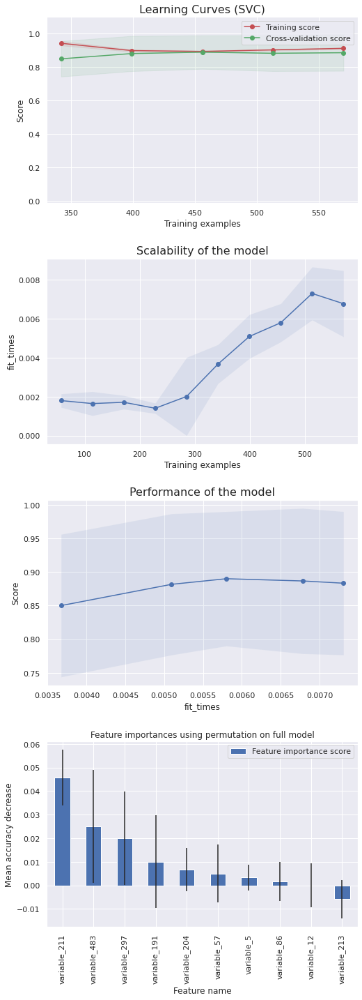




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,50,10
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.83,0.85,60.00
HCC,0.84,0.87,0.85,60.00
accuracy,0.85,0.85,0.85,0.85
macro avg,0.85,0.85,0.85,120.00
weighted avg,0.85,0.85,0.85,120.00


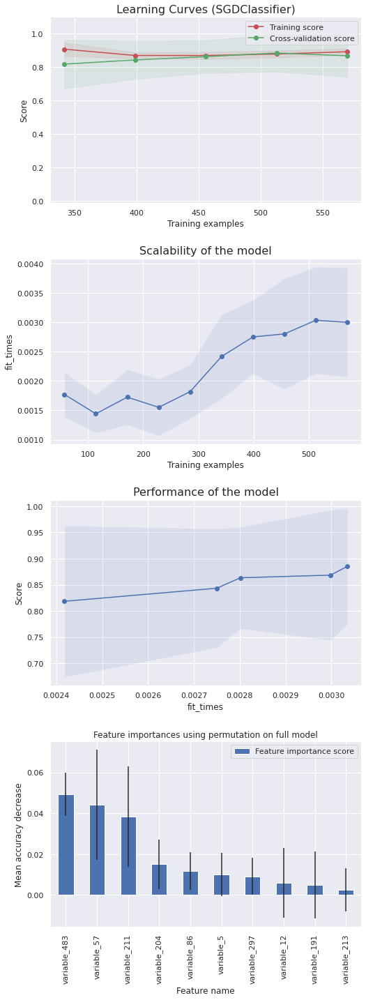




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,56,4
HCC,11,49



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.93,0.88,60.00
HCC,0.92,0.82,0.87,60.00
accuracy,0.88,0.88,0.88,0.88
macro avg,0.88,0.88,0.87,120.00
weighted avg,0.88,0.88,0.87,120.00


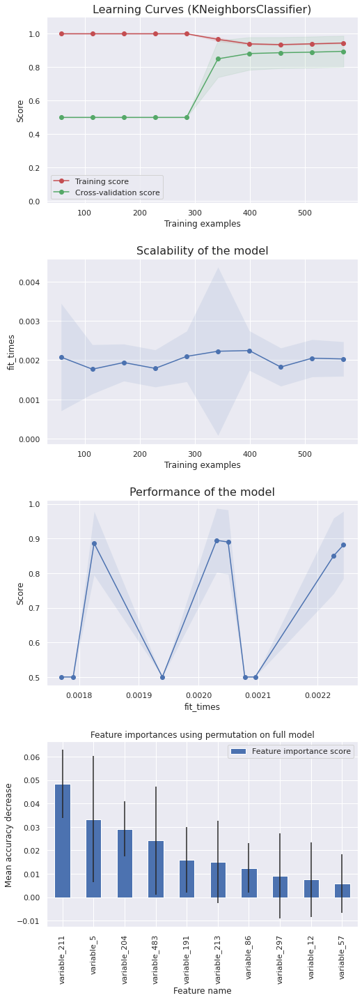




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,11
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.82,0.82,60.00
HCC,0.82,0.83,0.83,60.00
accuracy,0.82,0.82,0.82,0.82
macro avg,0.83,0.82,0.82,120.00
weighted avg,0.83,0.82,0.82,120.00


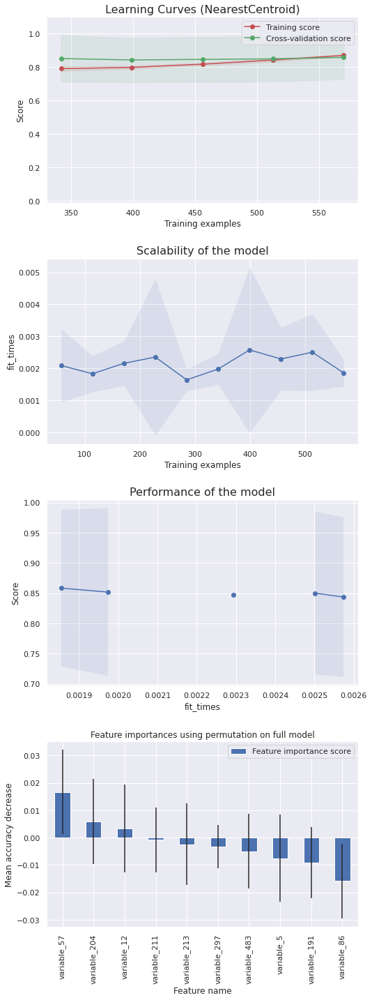




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.88,0.86,60.00
HCC,0.88,0.83,0.85,60.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.86,0.86,0.86,120.00
weighted avg,0.86,0.86,0.86,120.00


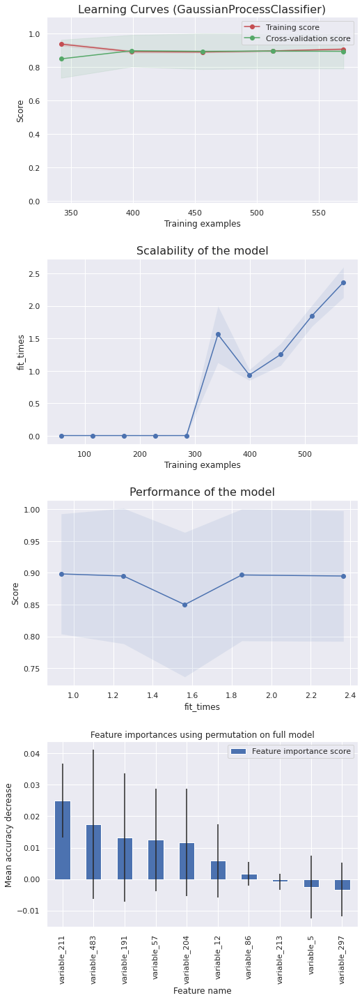




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,11,49



Classification report :


,precision,recall,f1-score,support
CRR,0.82,0.85,0.84,60.00
HCC,0.84,0.82,0.83,60.00
accuracy,0.83,0.83,0.83,0.83
macro avg,0.83,0.83,0.83,120.00
weighted avg,0.83,0.83,0.83,120.00


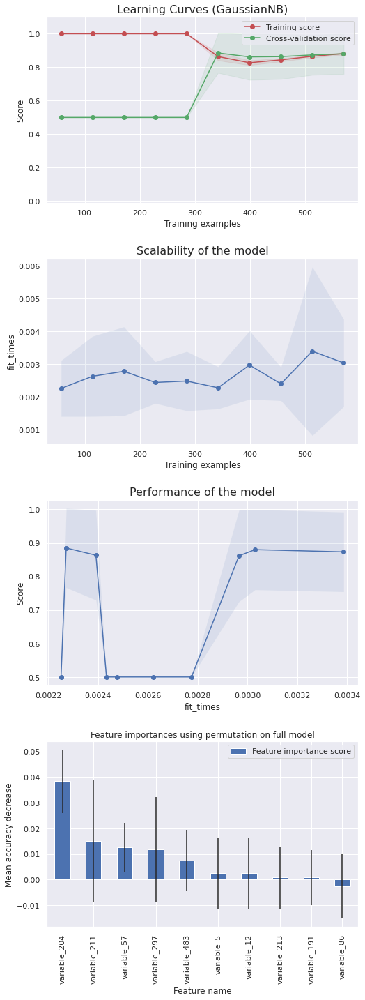




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.90,0.89,60.00
HCC,0.90,0.88,0.89,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.89,0.89,0.89,120.00
weighted avg,0.89,0.89,0.89,120.00


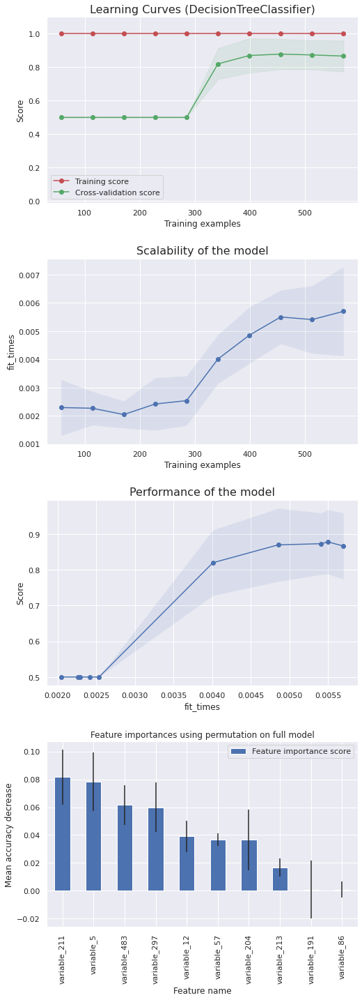




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.95,0.91,60.00
HCC,0.95,0.87,0.90,60.00
accuracy,0.91,0.91,0.91,0.91
macro avg,0.91,0.91,0.91,120.00
weighted avg,0.91,0.91,0.91,120.00


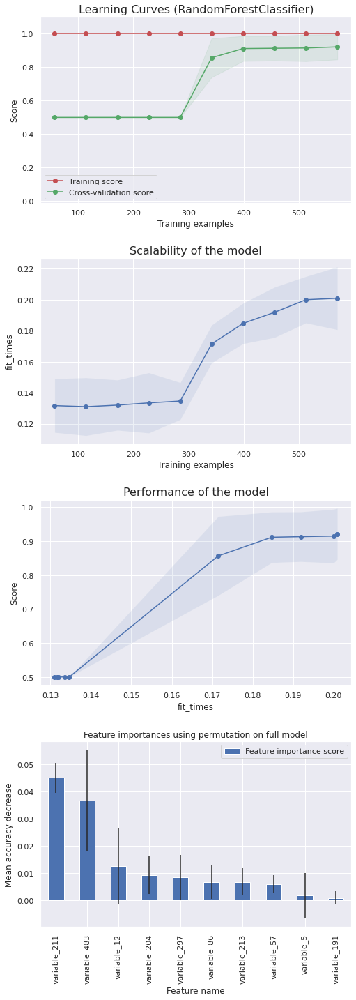




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.95,0.90,60.00
HCC,0.94,0.85,0.89,60.00
accuracy,0.90,0.90,0.90,0.90
macro avg,0.90,0.90,0.90,120.00
weighted avg,0.90,0.90,0.90,120.00


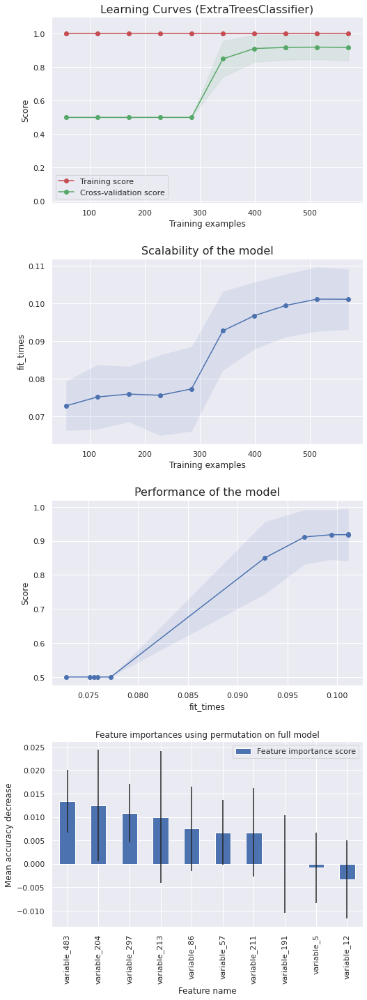




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,55,5
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.92,0.90,60.00
HCC,0.91,0.88,0.90,60.00
accuracy,0.90,0.90,0.90,0.90
macro avg,0.90,0.90,0.90,120.00
weighted avg,0.90,0.90,0.90,120.00


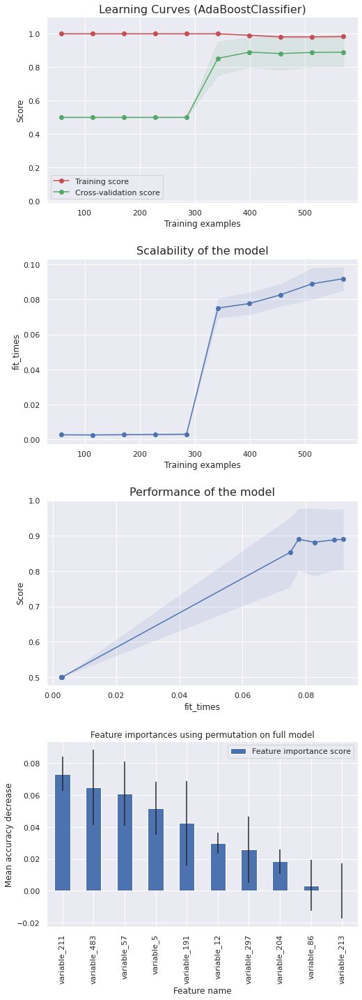




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,55,5
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.87,0.92,0.89,60.00
HCC,0.91,0.87,0.89,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.89,0.89,0.89,120.00
weighted avg,0.89,0.89,0.89,120.00


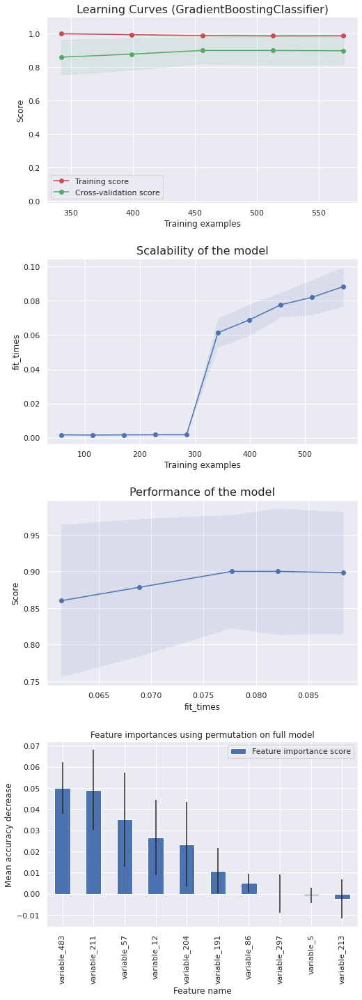




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.95,0.90,60.00
HCC,0.94,0.85,0.89,60.00
accuracy,0.90,0.90,0.90,0.90
macro avg,0.90,0.90,0.90,120.00
weighted avg,0.90,0.90,0.90,120.00


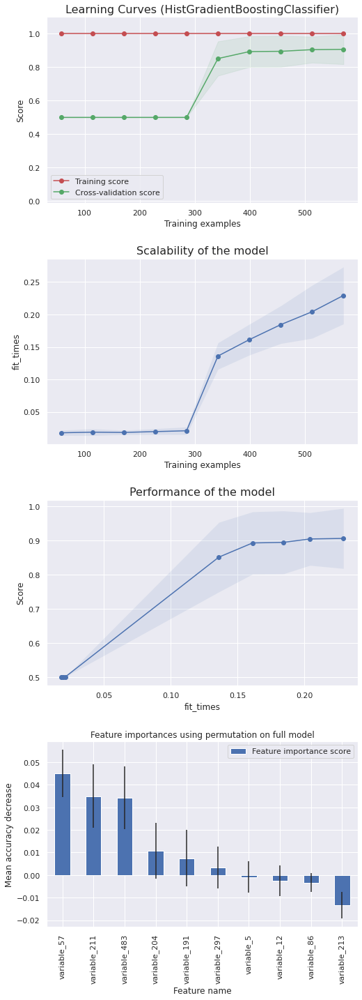




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.90,0.89,60.00
HCC,0.90,0.88,0.89,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.89,0.89,0.89,120.00
weighted avg,0.89,0.89,0.89,120.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

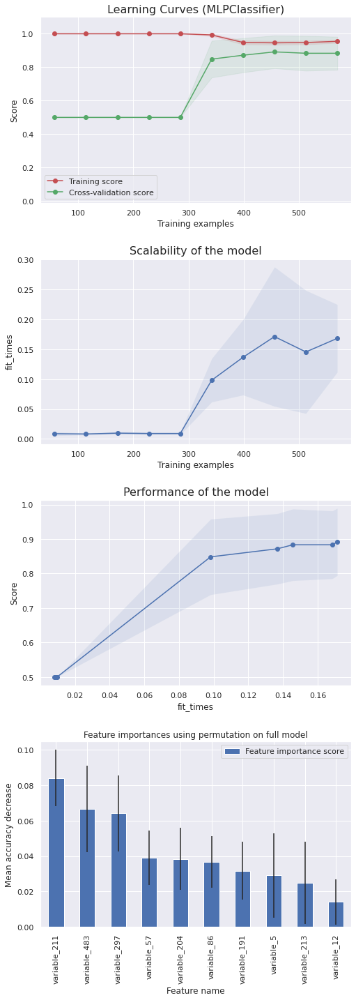




###################################################################################################################################################### 



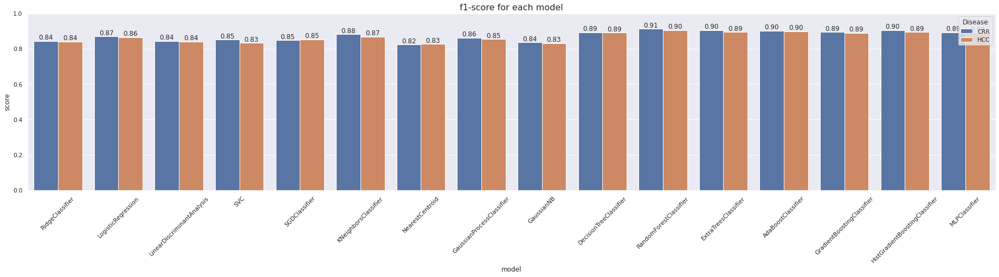


 ######################################################################################################################################################

Time to compute : 00h01m34s

 ######################################################################################################################################################






In [54]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_1_std_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=20, train_size=0.7, test_size=0.3)

In [55]:
print()

#### With the results above, we can dig a bit in models which work better than others.

#### To pick best models :
- learning curves :
    - both lines have to converge
        - if two curves and in the way to converge, it could be useful to add samples
    - training set has to be non always equal to 1 (that would mean overfitting of the model), unless validation score converges to 1
- scores : if learning curves has caracteristics cited above, score has to be the higher possible

#### To improve the best models :
- tune model hyperparameters
- if not too computationally expensive, increase number of cross-validation (cv parameter, can be set with <code>LeavOneOut()</code> model)
- change size of train and test sets
- checking mean decrease accuracy for feature importance, remove features with low value
    - some features can be important for classification in some models but not in other models

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.85,0.84,60.00
HCC,0.85,0.83,0.84,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.84,0.84,120.00
weighted avg,0.84,0.84,0.84,120.00


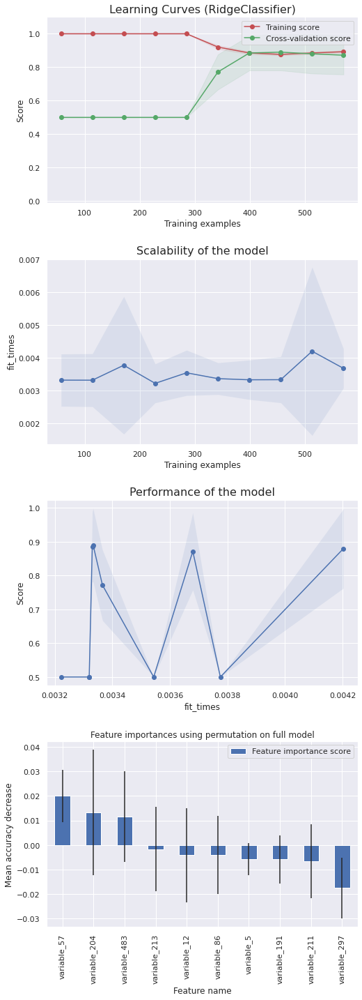




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.85,0.88,0.87,60.00
HCC,0.88,0.85,0.86,60.00
accuracy,0.87,0.87,0.87,0.87
macro avg,0.87,0.87,0.87,120.00
weighted avg,0.87,0.87,0.87,120.00


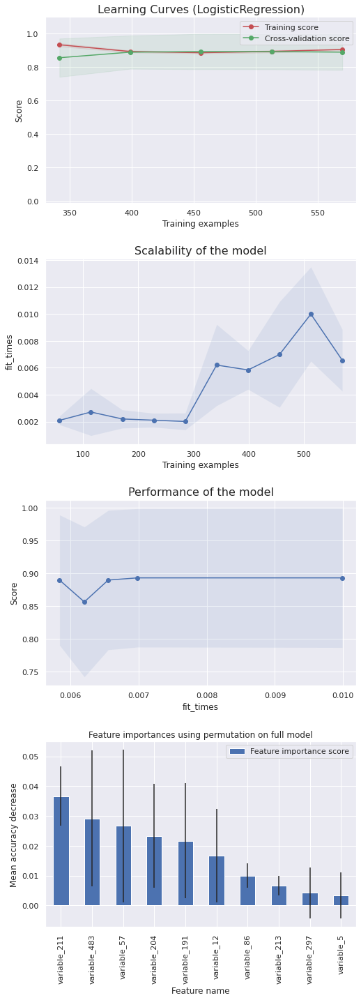




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.85,0.84,60.00
HCC,0.85,0.83,0.84,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.84,0.84,120.00
weighted avg,0.84,0.84,0.84,120.00


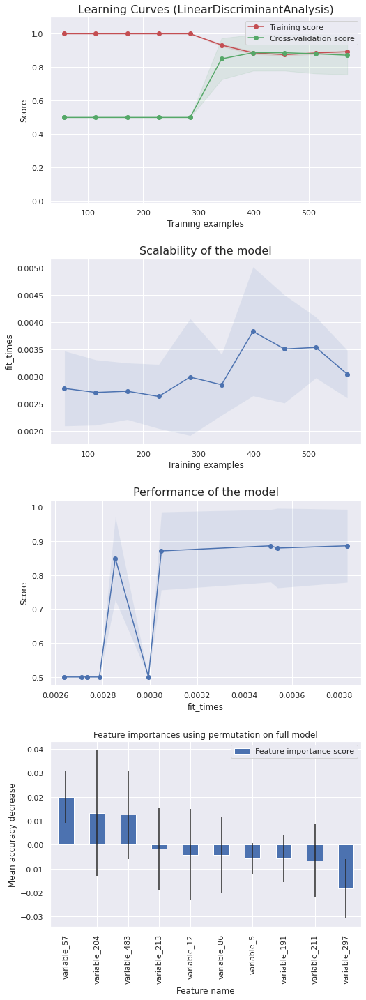




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,13,47



Classification report :


,precision,recall,f1-score,support
CRR,0.81,0.90,0.85,60.00
HCC,0.89,0.78,0.83,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.85,0.84,0.84,120.00
weighted avg,0.85,0.84,0.84,120.00


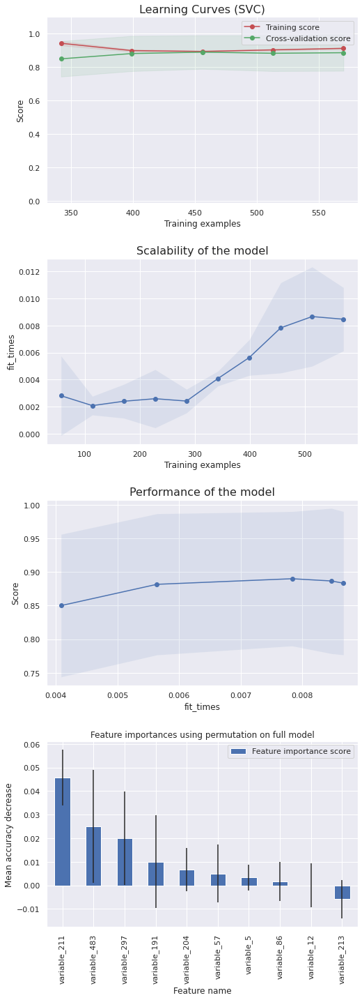




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.85,0.85,0.85,60.00
HCC,0.85,0.85,0.85,60.00
accuracy,0.85,0.85,0.85,0.85
macro avg,0.85,0.85,0.85,120.00
weighted avg,0.85,0.85,0.85,120.00


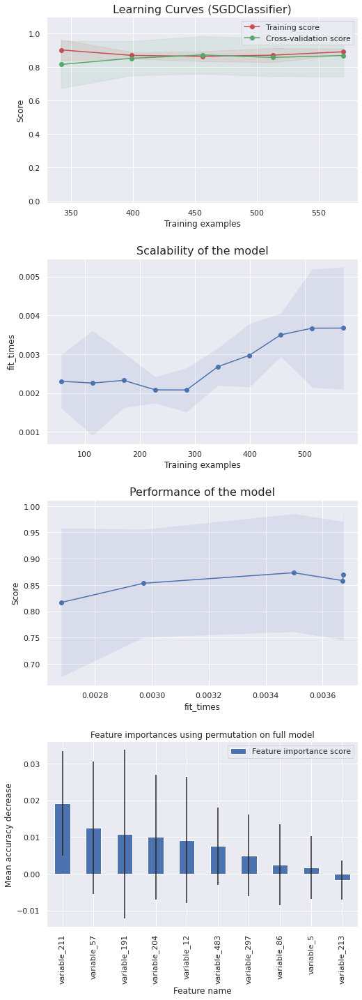




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,49,11
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.82,0.82,60.00
HCC,0.82,0.83,0.83,60.00
accuracy,0.82,0.82,0.82,0.82
macro avg,0.83,0.82,0.82,120.00
weighted avg,0.83,0.82,0.82,120.00


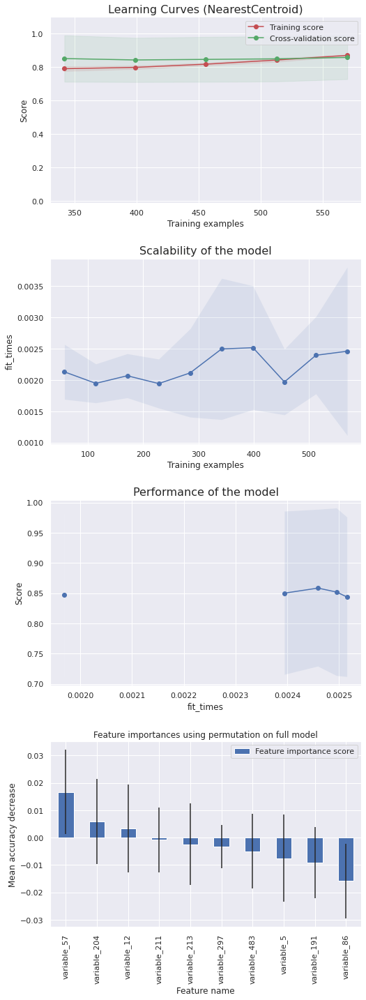




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,11,49



Classification report :


,precision,recall,f1-score,support
CRR,0.82,0.85,0.84,60.00
HCC,0.84,0.82,0.83,60.00
accuracy,0.83,0.83,0.83,0.83
macro avg,0.83,0.83,0.83,120.00
weighted avg,0.83,0.83,0.83,120.00


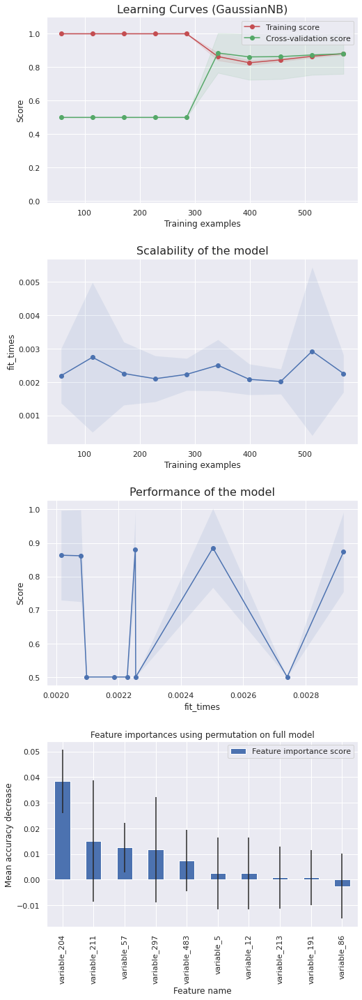




###################################################################################################################################################### 



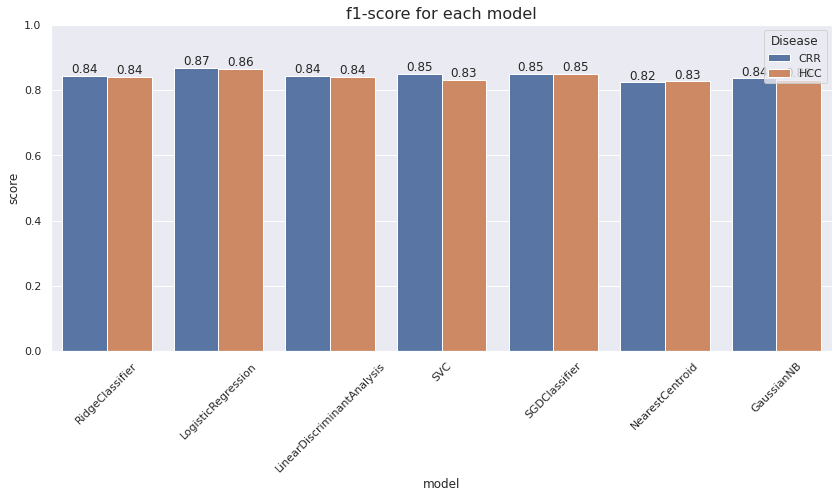


 ######################################################################################################################################################

Time to compute : 00h00m09s

 ######################################################################################################################################################






In [76]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC()
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianNB_ = GaussianNB()


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianNB': GaussianNB_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_1_std_fs_nb_10, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=20, train_size=0.8, test_size=0.2)

In [77]:
print()

#### To improve models, hyperparameters could be tuned, and useless features can be removed from input dataset

### with <code>X_remove_corr_imp_1_std_fs_nb_5</code>

#################################################################-----------------###################################################################
################################################################| RidgeClassifier |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,52,8
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.85,0.87,0.86,60.00
HCC,0.86,0.85,0.86,60.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.86,0.86,0.86,120.00
weighted avg,0.86,0.86,0.86,120.00


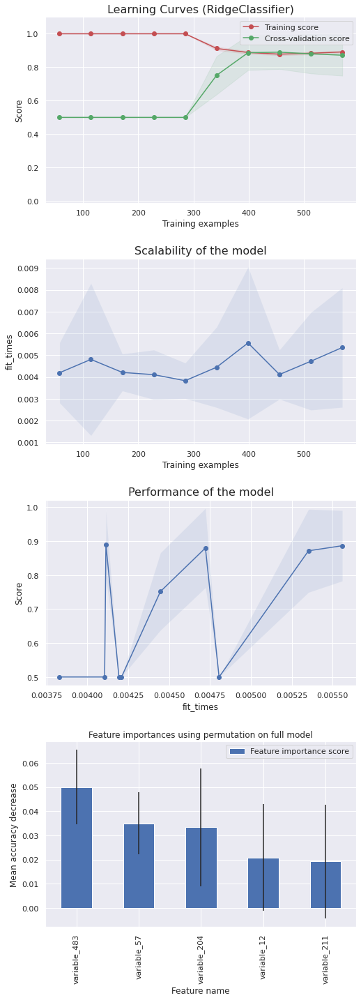




################################################################--------------------#################################################################
###############################################################| LogisticRegression |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,11,49



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.88,0.85,60.00
HCC,0.88,0.82,0.84,60.00
accuracy,0.85,0.85,0.85,0.85
macro avg,0.85,0.85,0.85,120.00
weighted avg,0.85,0.85,0.85,120.00


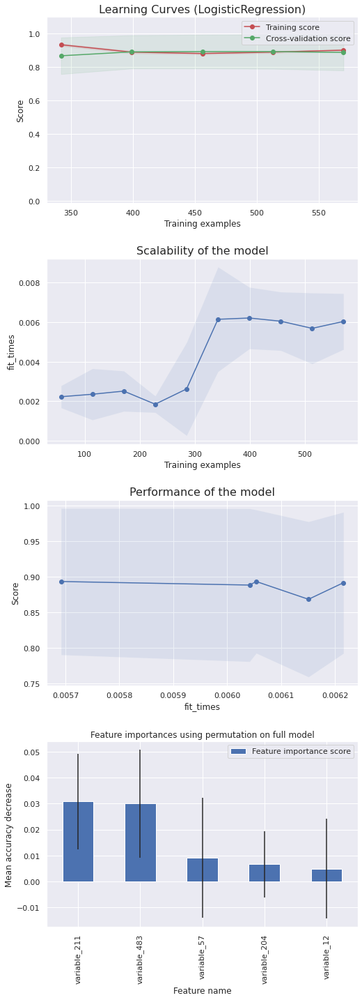




############################################################----------------------------#############################################################
###########################################################| LinearDiscriminantAnalysis |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,52,8
HCC,9,51



Classification report :


,precision,recall,f1-score,support
CRR,0.85,0.87,0.86,60.00
HCC,0.86,0.85,0.86,60.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.86,0.86,0.86,120.00
weighted avg,0.86,0.86,0.86,120.00


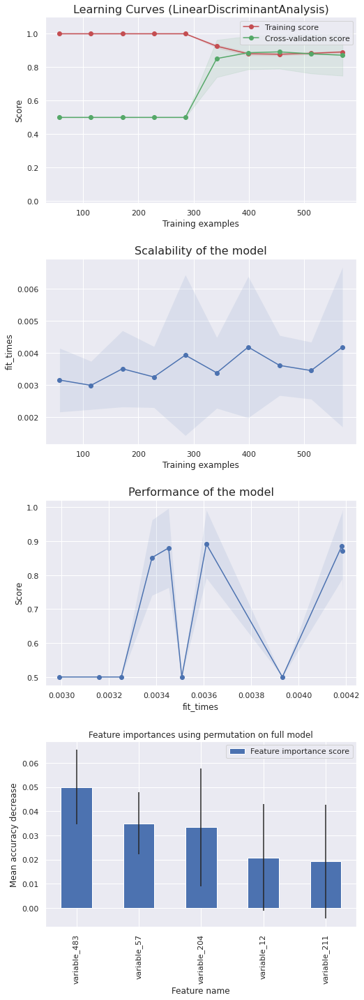




#######################################################################-----#########################################################################
######################################################################| SVC |########################################################################
#######################################################################-----#########################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,13,47



Classification report :


,precision,recall,f1-score,support
CRR,0.80,0.88,0.84,60.00
HCC,0.87,0.78,0.82,60.00
accuracy,0.83,0.83,0.83,0.83
macro avg,0.84,0.83,0.83,120.00
weighted avg,0.84,0.83,0.83,120.00


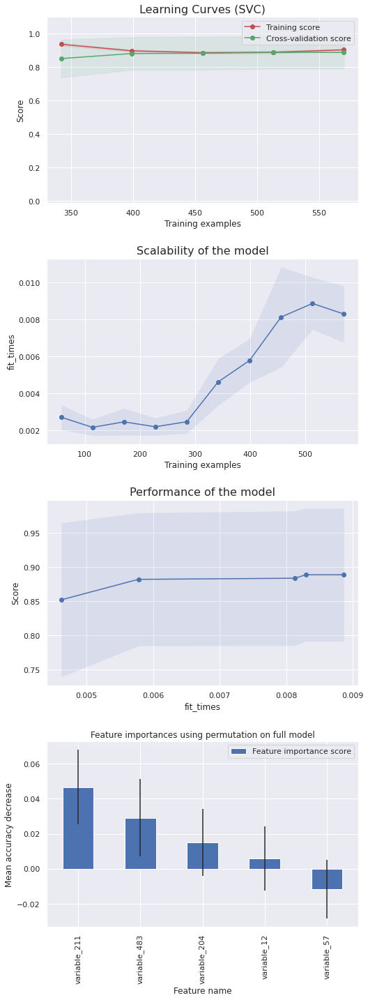




##################################################################---------------####################################################################
#################################################################| SGDClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,12,48



Classification report :


,precision,recall,f1-score,support
CRR,0.82,0.88,0.85,60.00
HCC,0.87,0.80,0.83,60.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.84,0.84,120.00
weighted avg,0.84,0.84,0.84,120.00


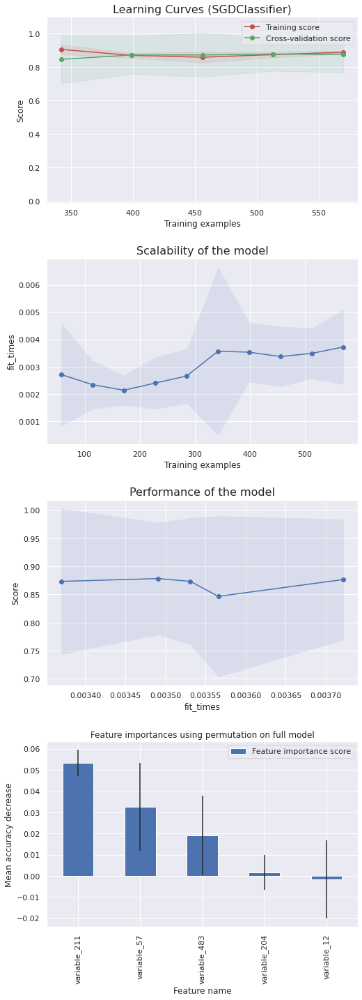




###############################################################----------------------################################################################
##############################################################| KNeighborsClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,54,6
HCC,12,48



Classification report :


,precision,recall,f1-score,support
CRR,0.82,0.90,0.86,60.00
HCC,0.89,0.80,0.84,60.00
accuracy,0.85,0.85,0.85,0.85
macro avg,0.85,0.85,0.85,120.00
weighted avg,0.85,0.85,0.85,120.00


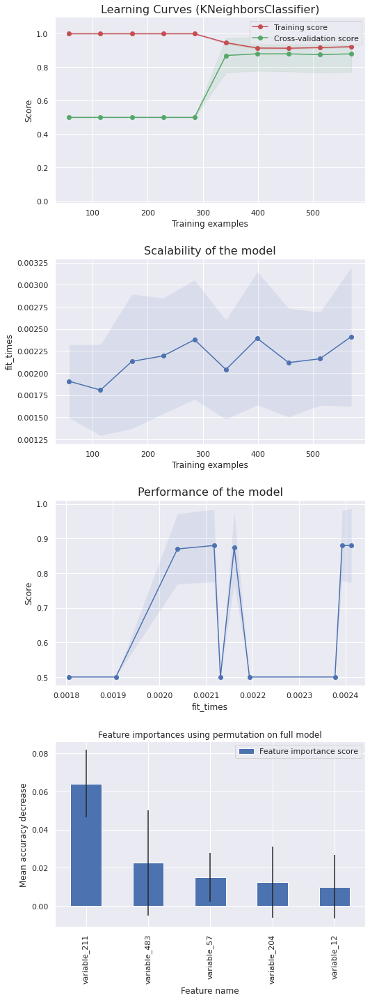




#################################################################-----------------###################################################################
################################################################| NearestCentroid |##################################################################
#################################################################-----------------###################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.85,0.86,60.00
HCC,0.85,0.88,0.87,60.00
accuracy,0.87,0.87,0.87,0.87
macro avg,0.87,0.87,0.87,120.00
weighted avg,0.87,0.87,0.87,120.00


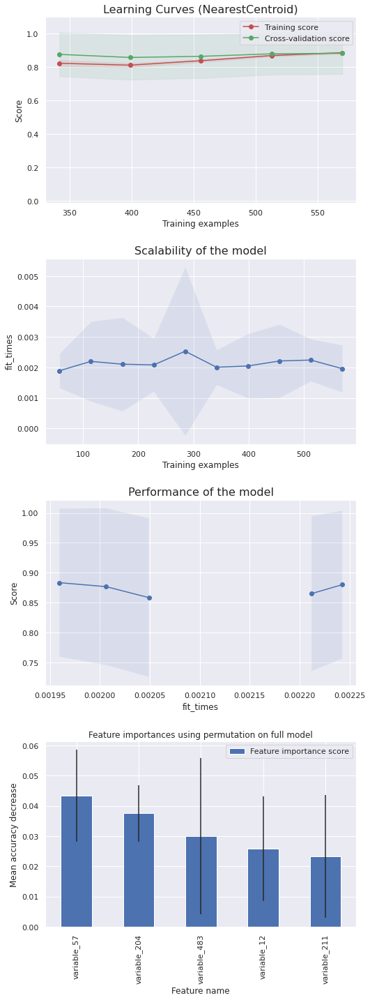




############################################################---------------------------##############################################################
###########################################################| GaussianProcessClassifier |#############################################################
############################################################---------------------------##############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,11,49



Classification report :


,precision,recall,f1-score,support
CRR,0.83,0.88,0.85,60.00
HCC,0.88,0.82,0.84,60.00
accuracy,0.85,0.85,0.85,0.85
macro avg,0.85,0.85,0.85,120.00
weighted avg,0.85,0.85,0.85,120.00


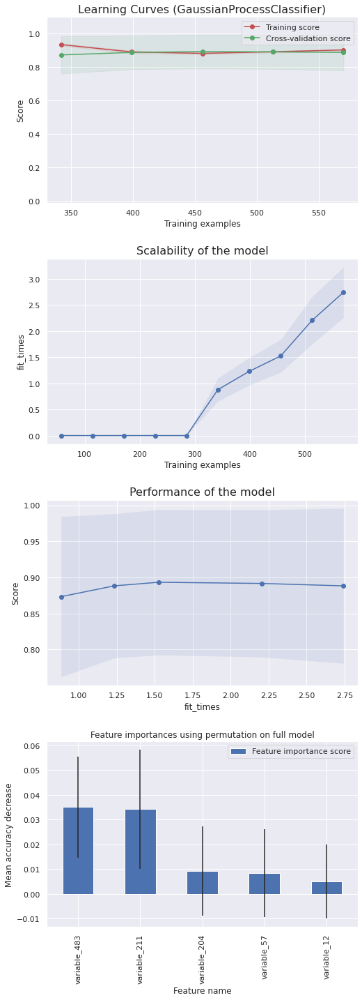




####################################################################------------#####################################################################
###################################################################| GaussianNB |####################################################################
####################################################################------------#####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,53,7
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.84,0.88,0.86,60.00
HCC,0.88,0.83,0.85,60.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.86,0.86,0.86,120.00
weighted avg,0.86,0.86,0.86,120.00


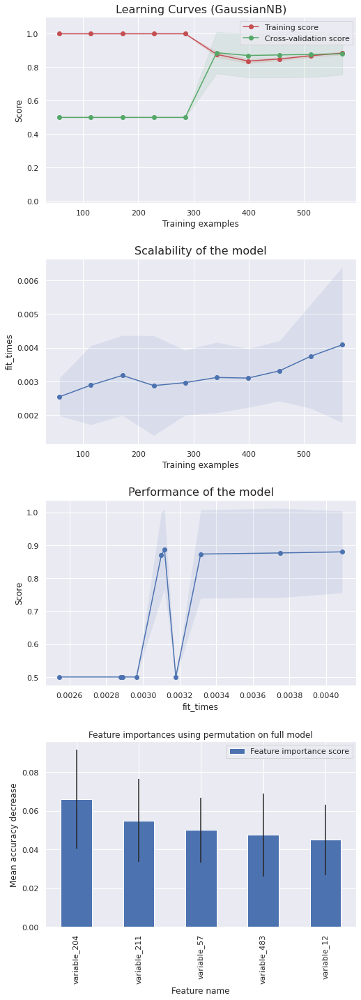




##############################################################------------------------###############################################################
#############################################################| DecisionTreeClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,51,9
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.86,0.85,0.86,60.00
HCC,0.85,0.87,0.86,60.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.86,0.86,0.86,120.00
weighted avg,0.86,0.86,0.86,120.00


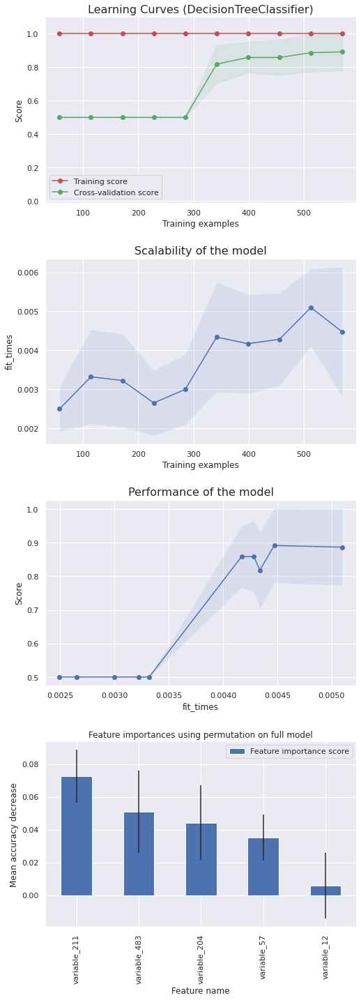




##############################################################------------------------###############################################################
#############################################################| RandomForestClassifier |##############################################################
##############################################################------------------------###############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,56,4
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.93,0.90,60.00
HCC,0.93,0.87,0.90,60.00
accuracy,0.90,0.90,0.90,0.90
macro avg,0.90,0.90,0.90,120.00
weighted avg,0.90,0.90,0.90,120.00


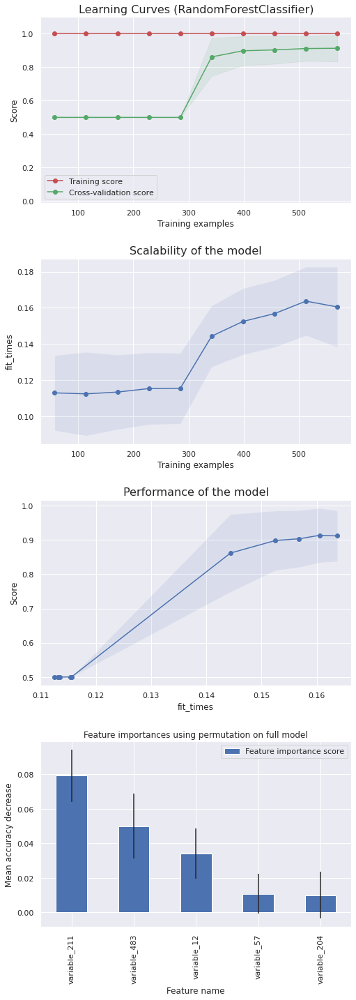




###############################################################----------------------################################################################
##############################################################| ExtraTreesClassifier |###############################################################
###############################################################----------------------################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,56,4
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.93,0.91,60.00
HCC,0.93,0.88,0.91,60.00
accuracy,0.91,0.91,0.91,0.91
macro avg,0.91,0.91,0.91,120.00
weighted avg,0.91,0.91,0.91,120.00


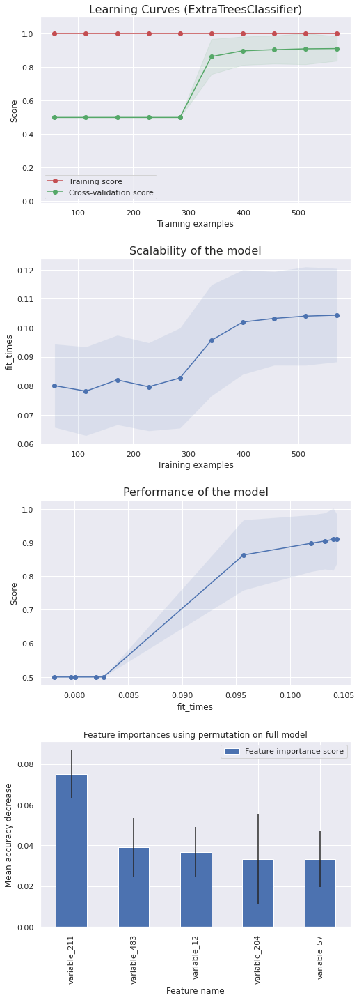




################################################################--------------------#################################################################
###############################################################| AdaBoostClassifier |################################################################
################################################################--------------------#################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,10,50



Classification report :


,precision,recall,f1-score,support
CRR,0.85,0.95,0.90,60.00
HCC,0.94,0.83,0.88,60.00
accuracy,0.89,0.89,0.89,0.89
macro avg,0.90,0.89,0.89,120.00
weighted avg,0.90,0.89,0.89,120.00


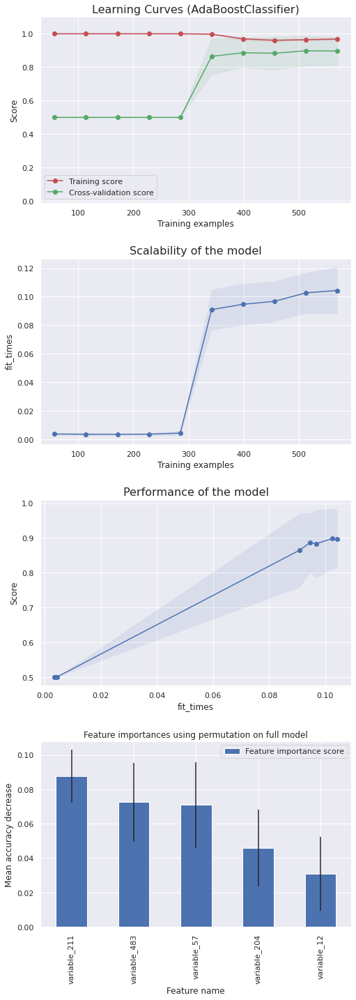




############################################################----------------------------#############################################################
###########################################################| GradientBoostingClassifier |############################################################
############################################################----------------------------#############################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,8,52



Classification report :


,precision,recall,f1-score,support
CRR,0.88,0.95,0.91,60.00
HCC,0.95,0.87,0.90,60.00
accuracy,0.91,0.91,0.91,0.91
macro avg,0.91,0.91,0.91,120.00
weighted avg,0.91,0.91,0.91,120.00


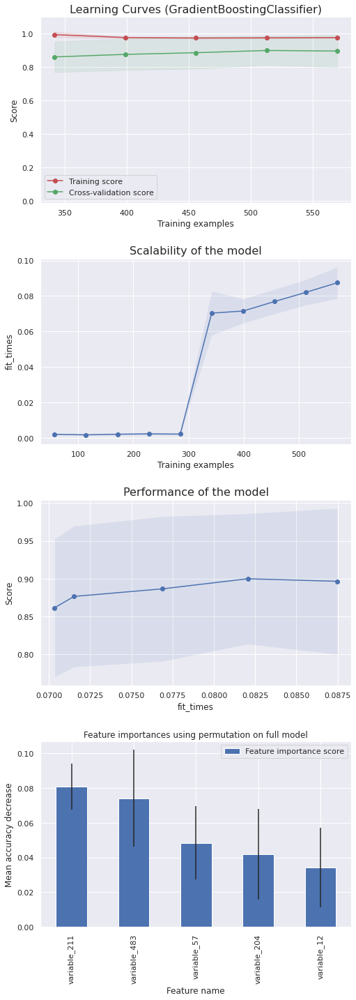




##########################################################--------------------------------###########################################################
#########################################################| HistGradientBoostingClassifier |##########################################################
##########################################################--------------------------------###########################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,57,3
HCC,7,53



Classification report :


,precision,recall,f1-score,support
CRR,0.89,0.95,0.92,60.00
HCC,0.95,0.88,0.91,60.00
accuracy,0.92,0.92,0.92,0.92
macro avg,0.92,0.92,0.92,120.00
weighted avg,0.92,0.92,0.92,120.00


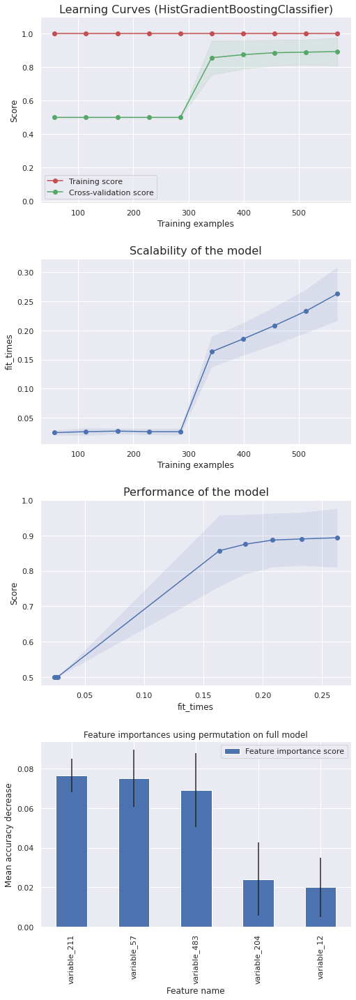




##################################################################---------------####################################################################
#################################################################| MLPClassifier |###################################################################
##################################################################---------------####################################################################

Corresponding classes to labels : {'CRR': 0, 'HCC': 1}

Confusion matrix :


,CRR,HCC
true/pred,,
CRR,56,4
HCC,13,47



Classification report :


,precision,recall,f1-score,support
CRR,0.81,0.93,0.87,60.00
HCC,0.92,0.78,0.85,60.00
accuracy,0.86,0.86,0.86,0.86
macro avg,0.87,0.86,0.86,120.00
weighted avg,0.87,0.86,0.86,120.00


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

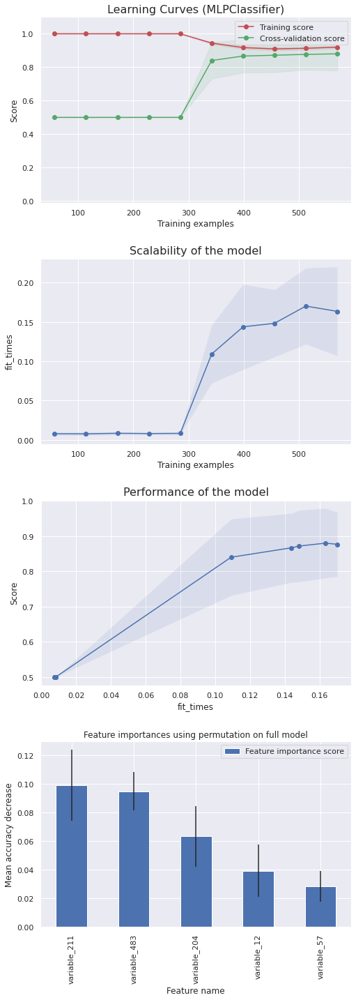




###################################################################################################################################################### 



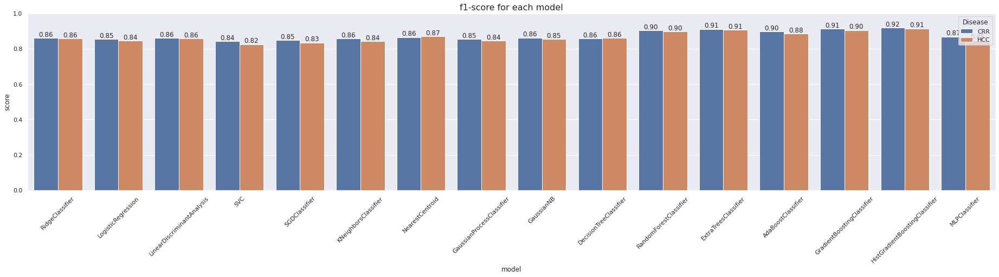


 ######################################################################################################################################################

Time to compute : 00h01m37s

 ######################################################################################################################################################






In [56]:
# Initialise models
RidgeClassifier_ = RidgeClassifier()
LogisticRegression_ = LogisticRegression()
LinearDiscriminantAnalysis_ = LinearDiscriminantAnalysis()
SVC_ = SVC(random_state=0)
SGDClassifier_ = SGDClassifier()
KNeighborsClassifier_ = KNeighborsClassifier()
NearestCentroid_ = NearestCentroid()
GaussianProcessClassifier_ = GaussianProcessClassifier(kernel=1.0 * RBF(1.0))
GaussianNB_ = GaussianNB()
DecisionTreeClassifier_ = DecisionTreeClassifier(random_state=0)
RandomForestClassifier_ = RandomForestClassifier(random_state=0)
ExtraTreesClassifier_ = ExtraTreesClassifier(random_state=0)
AdaBoostClassifier_ = AdaBoostClassifier(random_state=0)
GradientBoostingClassifier_ = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=0)
HistGradientBoostingClassifier_ = HistGradientBoostingClassifier(max_iter=100)
MLPClassifier_ = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), max_iter=300, random_state=1)


# Create dict with all models
dict_models = {'RidgeClassifier': RidgeClassifier_,
               'LogisticRegression': LogisticRegression_,
               'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis_,
               'SVC': SVC_,
               'SGDClassifier': SGDClassifier_,
               'KNeighborsClassifier': KNeighborsClassifier_,
               'NearestCentroid': NearestCentroid_,
               'GaussianProcessClassifier': GaussianProcessClassifier_,
               'GaussianNB': GaussianNB_,
               'DecisionTreeClassifier': DecisionTreeClassifier_,
               'RandomForestClassifier': RandomForestClassifier_,
               'ExtraTreesClassifier': ExtraTreesClassifier_,
               'AdaBoostClassifier': AdaBoostClassifier_,
               'GradientBoostingClassifier': GradientBoostingClassifier_,
               'HistGradientBoostingClassifier': HistGradientBoostingClassifier_,
               'MLPClassifier': MLPClassifier_
              }


# Launch classification pipeline
df_scores, dict_df_feature_importance = pipeline_classification(X=X_remove_corr_imp_1_std_fs_nb_5, y=target,
                                                                dict_models=dict_models, plot_each_model=True, plot_hist_score=True,
                                                                score='f1-score', cv=LeaveOneOut(), train_size=0.7, test_size=0.3)

In [57]:
print()

### On the above barplot, we can choose a model and dig into its caracteristics, e.g. *RandomForestClassifier*

In [58]:
df_scores

,RidgeClassifier,LogisticRegression,LinearDiscriminantAnalysis,SVC,SGDClassifier,KNeighborsClassifier,NearestCentroid,GaussianProcessClassifier,GaussianNB,DecisionTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,MLPClassifier
CRR,0.86,0.85,0.86,0.84,0.85,0.86,0.86,0.85,0.86,0.86,0.90,0.91,0.90,0.91,0.92,0.87
HCC,0.86,0.84,0.86,0.82,0.83,0.84,0.87,0.84,0.85,0.86,0.90,0.91,0.88,0.90,0.91,0.85


In [59]:
dict_df_feature_importance['RandomForestClassifier']

,Feature name,Feature importance score
2,variable_211,0.08
1,variable_483,0.05
0,variable_12,0.03
4,variable_57,0.01
3,variable_204,0.01


In [60]:
print()

### We can then dig into the dictionary file of metadata to check to which biological compounds corresponds the feature names above !

# 7 - Clustering

In [61]:
from clustering_functions import *

In [62]:
# target = 

## a - Kmeans

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



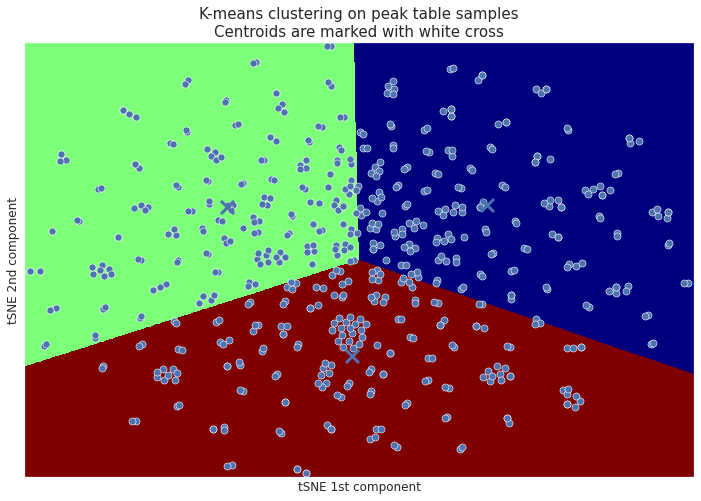

Inertia of k-means model : 295044.74


In [63]:
kmeans = perform_kmeans(X_remove_corr_imp_1_std_PCA_tSNE.astype('double'), n_clusters=3, col_prefix='tSNE')

## b - Affinity propagation

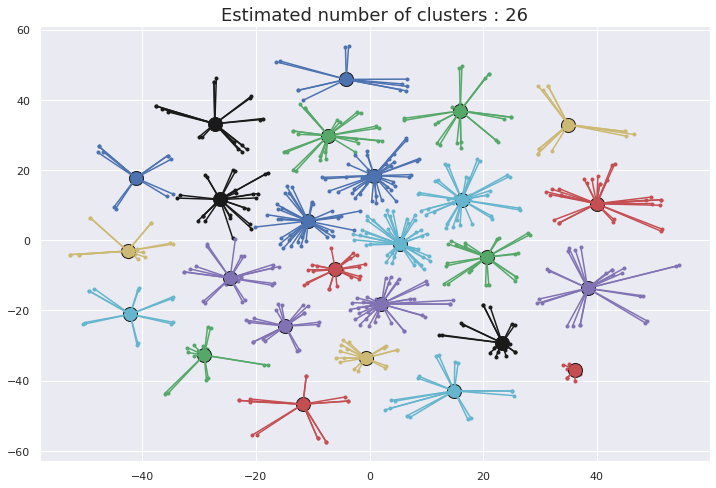

In [64]:
af = perform_affinity_propagation(X_remove_corr_imp_1_std_PCA_tSNE)

## c - Hierarchical clustering

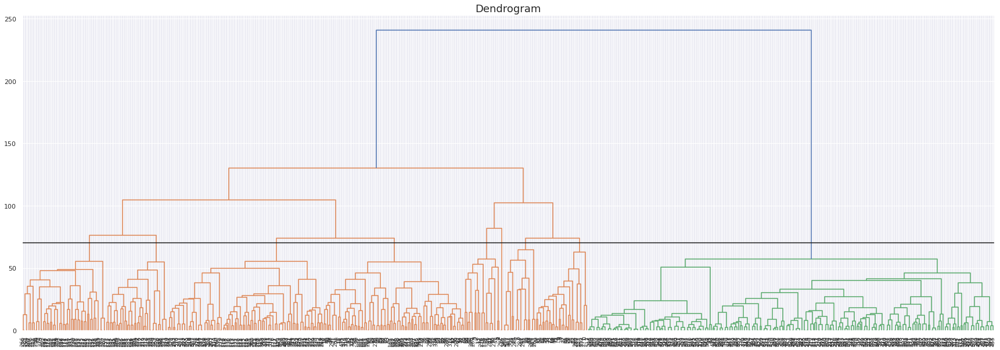

In [66]:
plot_dendrogram(X_remove_corr_imp_1_std_PCA, hline=70)

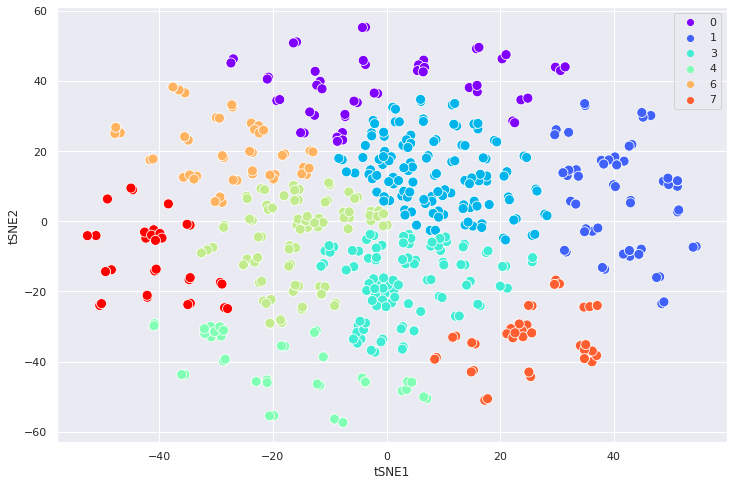

In [67]:
hc = perform_hierarchical_clustering(X_remove_corr_imp_1_std_PCA_tSNE, n_clusters=9)

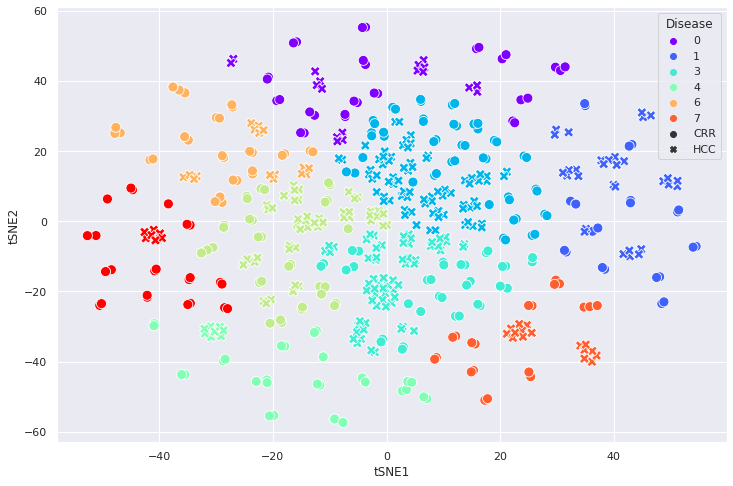

In [68]:
hc = perform_hierarchical_clustering(X_remove_corr_imp_1_std_PCA_tSNE, target=target, n_clusters=9)